In [ ]:
from google.colab import files
from IPython.display import Image
uploaded_images = files.upload()

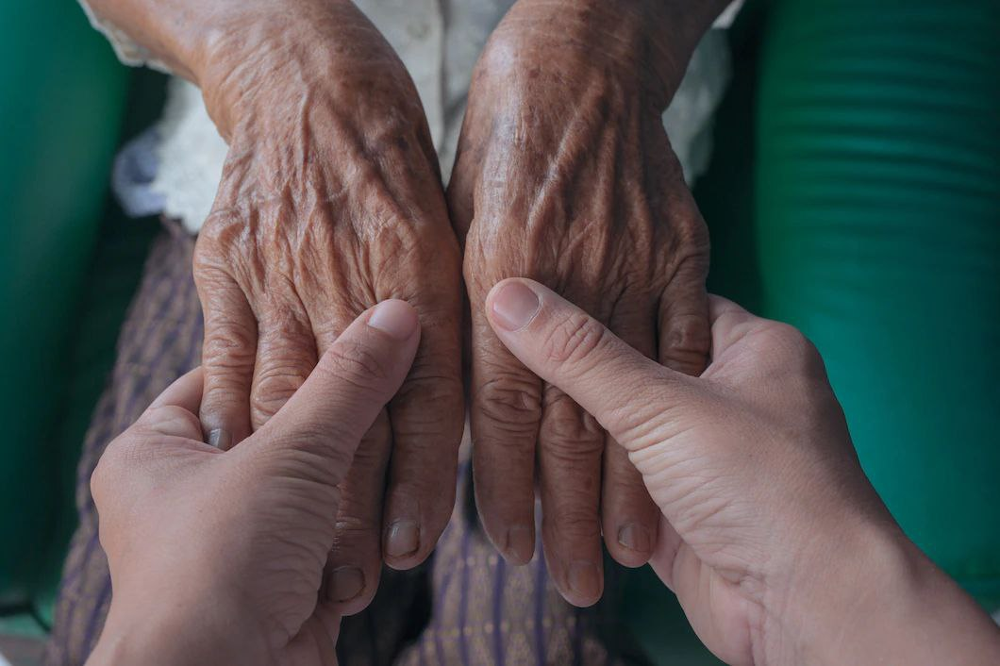

In [ ]:
Image('Header.jpg')

# Parkinson Disease Predictor
## 1.Introduction to the disease

**Parkinson's is a neurodegenarative progressive disorder disease. It affects the nervous system and the part of the body controlled by it. It appears in the part of the brain called substantia nigra. Normally these brain cells produce dopamine and these dopamine operates in a delicate balance with other neurotransmitters to help cordinate the millions of nerve and muscle cell involved in the movement. When these nerve cells die or become impaired, they lose the ability to produce the dopamine. When 60-80% of these cells are lost then enough dopamine are not produced and Parkinson's motor symptoms appear. Without enough dopamine, this balance is disrupted resulting tremor, rigidity, slowness of movement and impaired balance. So Parkinson's disease is caused by the disruption of the brain cells that produce the dopamine which allows the brain to communicate each other and control the fluency of the movement. It is thought that the disease begins many years before the motor symptoms appears and therefore, researchers are looking for ways to recognize the non-motor symptoms that appear early in the disease as early as possible, thereby halting the progression of the disease. A person suffering from the Parkinson's can have following symptoms:**


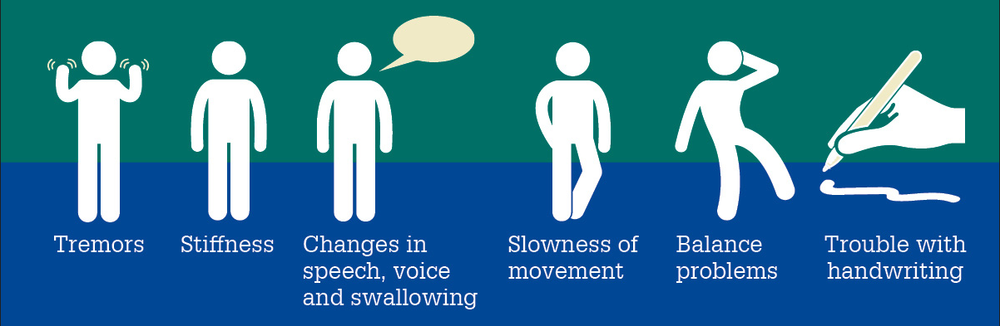

In [ ]:
Image('Parkinson_symptoms.png')

-*Tremor*

-*Slowed movement*

-*Rigid muscle*

-*Impaired posture*

-*Loss of automatic movement*

-*Speech change*

-*Writing change*

-*Impaired posture*

## Importing libraries and models

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.font_manager import FontProperties
import seaborn as sns
from sklearn.preprocessing import MinMaxScaler
from imblearn.under_sampling import RandomUnderSampler
from imblearn.over_sampling import SMOTE
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from sklearn.ensemble import RandomForestClassifier, StackingClassifier
from sklearn.neural_network import MLPClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.svm import SVC
from xgboost import XGBClassifier
from sklearn.tree import DecisionTreeClassifier, plot_tree
from sklearn.metrics import accuracy_score, f1_score, recall_score, precision_score, confusion_matrix, roc_curve, auc
import joblib
import tkinter as tk
from tkinter import messagebox

**Creating color and font schemas**

In [ ]:
colors_1  = [(0.360,0.705,0.835), (0, 0, 0.572)]
greys_1 = [(0.703125,0.703125,0.703125), (0.29296875, 0.29296875, 0.29296875),]
greys_1_flipped = [ (0.29296875,0.29296875,0.29296875), (0.703125,0.703125,0.703125)]
greys_2 = [('#282828'), (0.68,0.68,0.68)]
colors_2 = [(0.705,0.705,0.705),(1,0.647,0)]

font_title = FontProperties()
font_title.set_family('serif')
font_title.set_name('Times New Roman')
font_title.set_size(20)

font_footer = FontProperties()
font_footer.set_family('serif')
font_footer.set_name('Times New Roman')
font_footer.set_size(70)

font_footer_roc_curve = FontProperties()
font_footer_roc_curve.set_family('serif')
font_footer_roc_curve.set_name('Times New Roman')
font_footer_roc_curve.set_size(30)

# 2.Parkinsons's disease dataset
## loading data


In [ ]:
data=pd.read_csv("Parkinsons_Data.csv")

## Understanding our data
### Data Set Information:
**This dataset is composed of a range of biomedical voice measurements from 31 people, 23 with Parkinson's disease (PD). Each column in the table is a particular voice measure, and each row corresponds to one of 195 voice recordings from these individuals ("name" column). The main aim of the data is to discriminate healthy people from those with PD, according to the "status" column which is set to 0 for healthy and 1 for PD.**

**Attribute Information:**

Matrix column entries (attributes):

name - ASCII subject name and recording number

MDVP:Fo(Hz) - Average vocal fundamental frequency

MDVP:Fhi(Hz) - Maximum vocal fundamental frequency

MDVP:Flo(Hz) - Minimum vocal fundamental frequency

MDVP:Jitter(%) , MDVP:Jitter(Abs) , MDVP:RAP , MDVP:PPQ , Jitter:DDP - Several measures of variation in fundamental frequency

MDVP:Shimmer , MDVP:Shimmer(dB) , Shimmer:APQ3 , Shimmer:APQ5 , MDVP:APQ , Shimmer:DDA - Several measures of variation in amplitude

NHR , HNR - Two measures of ratio of noise to tonal components in the voice

status - Health status of the subject (one) - Parkinson's, (zero) - healthy

RPDE , D2 - Two nonlinear dynamical complexity measures

DFA - Signal fractal scaling exponent

spread1 , spread2 , PPE - Three nonlinear measures of fundamental frequency variation

In [ ]:
data.head()

,name,MDVP:Fo(Hz),MDVP:Fhi(Hz),MDVP:Flo(Hz),MDVP:Jitter(%),MDVP:Jitter(Abs),MDVP:RAP,MDVP:PPQ,Jitter:DDP,MDVP:Shimmer,...,Shimmer:DDA,NHR,HNR,status,RPDE,DFA,spread1,spread2,D2,PPE
0,phon_R01_S01_1,119.992,157.302,74.997,0.00784,0.00007,0.00370,0.00554,0.01109,0.04374,...,0.06545,0.02211,21.033,1,0.414783,0.815285,-4.813031,0.266482,2.301442,0.284654
1,phon_R01_S01_2,122.400,148.650,113.819,0.00968,0.00008,0.00465,0.00696,0.01394,0.06134,...,0.09403,0.01929,19.085,1,0.458359,0.819521,-4.075192,0.335590,2.486855,0.368674
2,phon_R01_S01_3,116.682,131.111,111.555,0.01050,0.00009,0.00544,0.00781,0.01633,0.05233,...,0.08270,0.01309,20.651,1,0.429895,0.825288,-4.443179,0.311173,2.342259,0.332634
3,phon_R01_S01_4,116.676,137.871,111.366,0.00997,0.00009,0.00502,0.00698,0.01505,0.05492,...,0.08771,0.01353,20.644,1,0.434969,0.819235,-4.117501,0.334147,2.405554,0.368975
4,phon_R01_S01_5,116.014,141.781,110.655,0.01284,0.00011,0.00655,0.00908,0.01966,0.06425,...,0.10470,0.01767,19.649,1,0.417356,0.823484,-3.747787,0.234513,2.332180,0.410335


In [ ]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 195 entries, 0 to 194
Data columns (total 24 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   name              195 non-null    object 
 1   MDVP:Fo(Hz)       195 non-null    float64
 2   MDVP:Fhi(Hz)      195 non-null    float64
 3   MDVP:Flo(Hz)      195 non-null    float64
 4   MDVP:Jitter(%)    195 non-null    float64
 5   MDVP:Jitter(Abs)  195 non-null    float64
 6   MDVP:RAP          195 non-null    float64
 7   MDVP:PPQ          195 non-null    float64
 8   Jitter:DDP        195 non-null    float64
 9   MDVP:Shimmer      195 non-null    float64
 10  MDVP:Shimmer(dB)  195 non-null    float64
 11  Shimmer:APQ3      195 non-null    float64
 12  Shimmer:APQ5      195 non-null    float64
 13  MDVP:APQ          195 non-null    float64
 14  Shimmer:DDA       195 non-null    float64
 15  NHR               195 non-null    float64
 16  HNR               195 non-null    float64
 1

### Checking if there are NANs (missing values) in the dataset

In [ ]:
data.isnull().sum()

name                0
MDVP:Fo(Hz)         0
MDVP:Fhi(Hz)        0
MDVP:Flo(Hz)        0
MDVP:Jitter(%)      0
MDVP:Jitter(Abs)    0
MDVP:RAP            0
MDVP:PPQ            0
Jitter:DDP          0
MDVP:Shimmer        0
MDVP:Shimmer(dB)    0
Shimmer:APQ3        0
Shimmer:APQ5        0
MDVP:APQ            0
Shimmer:DDA         0
NHR                 0
HNR                 0
status              0
RPDE                0
DFA                 0
spread1             0
spread2             0
D2                  0
PPE                 0
dtype: int64

**There are no NANs in the dataset**

In [ ]:
data.describe()

,MDVP:Fo(Hz),MDVP:Fhi(Hz),MDVP:Flo(Hz),MDVP:Jitter(%),MDVP:Jitter(Abs),MDVP:RAP,MDVP:PPQ,Jitter:DDP,MDVP:Shimmer,MDVP:Shimmer(dB),...,Shimmer:DDA,NHR,HNR,status,RPDE,DFA,spread1,spread2,D2,PPE
count,195.000000,195.000000,195.000000,195.000000,195.000000,195.000000,195.000000,195.000000,195.000000,195.000000,...,195.000000,195.000000,195.000000,195.000000,195.000000,195.000000,195.000000,195.000000,195.000000,195.000000
mean,154.228641,197.104918,116.324631,0.006220,0.000044,0.003306,0.003446,0.009920,0.029709,0.282251,...,0.046993,0.024847,21.885974,0.753846,0.498536,0.718099,-5.684397,0.226510,2.381826,0.206552
std,41.390065,91.491548,43.521413,0.004848,0.000035,0.002968,0.002759,0.008903,0.018857,0.194877,...,0.030459,0.040418,4.425764,0.431878,0.103942,0.055336,1.090208,0.083406,0.382799,0.090119
min,88.333000,102.145000,65.476000,0.001680,0.000007,0.000680,0.000920,0.002040,0.009540,0.085000,...,0.013640,0.000650,8.441000,0.000000,0.256570,0.574282,-7.964984,0.006274,1.423287,0.044539
25%,117.572000,134.862500,84.291000,0.003460,0.000020,0.001660,0.001860,0.004985,0.016505,0.148500,...,0.024735,0.005925,19.198000,1.000000,0.421306,0.674758,-6.450096,0.174351,2.099125,0.137451
50%,148.790000,175.829000,104.315000,0.004940,0.000030,0.002500,0.002690,0.007490,0.022970,0.221000,...,0.038360,0.011660,22.085000,1.000000,0.495954,0.722254,-5.720868,0.218885,2.361532,0.194052
75%,182.769000,224.205500,140.018500,0.007365,0.000060,0.003835,0.003955,0.011505,0.037885,0.350000,...,0.060795,0.025640,25.075500,1.000000,0.587562,0.761881,-5.046192,0.279234,2.636456,0.252980
max,260.105000,592.030000,239.170000,0.033160,0.000260,0.021440,0.019580,0.064330,0.119080,1.302000,...,0.169420,0.314820,33.047000,1.000000,0.685151,0.825288,-2.434031,0.450493,3.671155,0.527367


In [ ]:
data.columns

Index(['name', 'MDVP:Fo(Hz)', 'MDVP:Fhi(Hz)', 'MDVP:Flo(Hz)', 'MDVP:Jitter(%)',
       'MDVP:Jitter(Abs)', 'MDVP:RAP', 'MDVP:PPQ', 'Jitter:DDP',
       'MDVP:Shimmer', 'MDVP:Shimmer(dB)', 'Shimmer:APQ3', 'Shimmer:APQ5',
       'MDVP:APQ', 'Shimmer:DDA', 'NHR', 'HNR', 'status', 'RPDE', 'DFA',
       'spread1', 'spread2', 'D2', 'PPE'],
      dtype='object')

### Checking if there are duplicated rows in the dataset

In [ ]:
data.duplicated().sum()

0

**There are no duplicated rows in the dataset**

In [ ]:
data["status"].value_counts()

1    147
0     48
Name: status, dtype: int64

### The Dataset is biased towards the (M)alignant category

# 3.Data Analysis and Visualization


C:\Users\mrwan\AppData\Local\Temp\ipykernel_14520\3901485241.py:2: UserWarning: To output multiple subplots, the figure containing the passed axes is being cleared.
  data.hist(ax=ax)


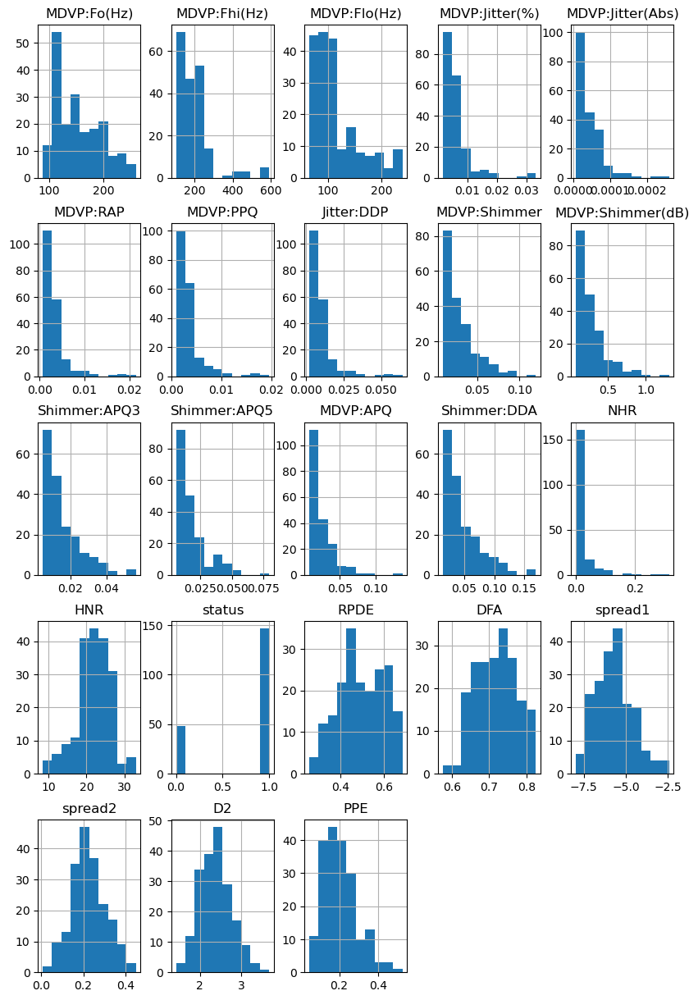

In [ ]:
fig, ax = plt.subplots(figsize =(10, 15))
data.hist(ax=ax)
plt.show()

<hr>

## -- Boxplot
**Boxplots are an important tool for understanding the distribution of your data and identifying potential outliers or anomalies, Boxplots provide a visual representation of the distribution of your data, including the median, quartiles, and any outliers.**
**boxplots are sensitive to the scale of the data as it is based on it's quartiles, we should normalize the data before every feature boxplot, If the data are on different scales, the boxplots may not be directly comparable and may lead to incorrect conclusions about the data.**

<Axes: >

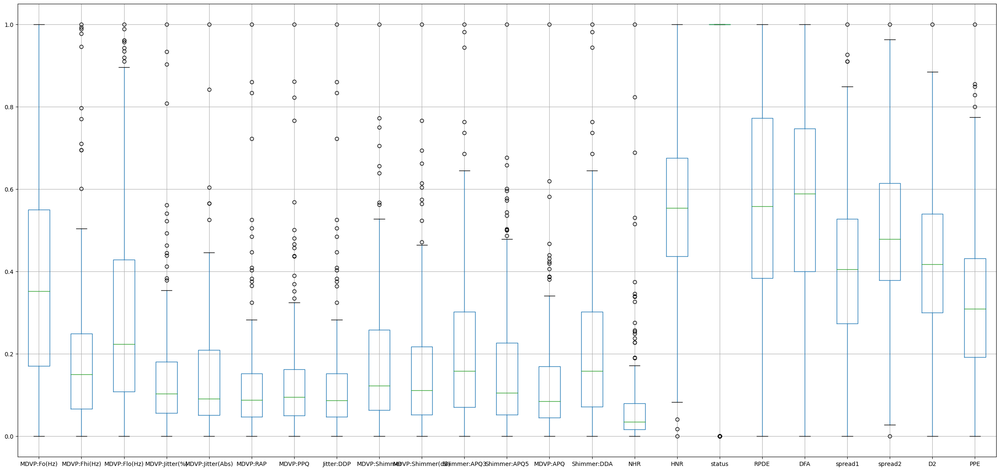

In [ ]:
minmax = MinMaxScaler()
data_boxplot = data.drop(['name'],axis=1)
data_boxplot = minmax.fit_transform(data_boxplot)
boxplot = pd.DataFrame(data_boxplot, columns = data.drop(['name'],axis=1).columns)
boxplot.boxplot(figsize=(30,14))

**- These points outside the whiskers are identified as outliers.**

**- Outliers are data points that fall outside the interquartile range (IQR) of the data and are often considered as extreme values. While outliers are commonly viewed as anomalies or errors, they can also represent real-world variability and provide valuable insights into the data.**

**- According to our case and dataset distribution, outliers may represent rare events or extreme cases that are important to include in the analysis In finance, outliers provide important insights into the data and the underlying distribution.**

** **

## -- Correlation heatmap
### Visualizing the correlation between each feature

**Knowing the correlation between features can be useful in several ways:**

**1. Feature selection: Correlation analysis can help identify which features are highly correlated with the target variable or with each other. This information can be used to select the most relevant features for a predictive model, which can improve the accuracy and interpretability of the model.**

**2. Data exploration: Correlation analysis can help identify interesting patterns and relationships in the data, which can guide further analysis and investigation. For example, a strong negative correlation between two features might suggest that they are measuring different aspects of the same phenomenon, or that one feature is a confounding variable for the other.**

**3. Multicollinearity detection: Correlation analysis can help detect multicollinearity, which occurs when two or more features are highly correlated with each other. Multicollinearity can cause problems for predictive models, as it can lead to unstable coefficient estimates and reduced model interpretability.**

**4. Outlier detection: Correlation analysis can help identify outliers, which are data points that are significantly different from the rest of the data. Outliers can have a large influence on the correlation coefficients, so identifying and removing them can help to improve the accuracy of the correlation analysis.**

C:\Users\mrwan\AppData\Local\Temp\ipykernel_14520\1625314351.py:2: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  sns.heatmap(data.corr(), annot = True, cmap = 'YlGnBu',annot_kws={'size':19})


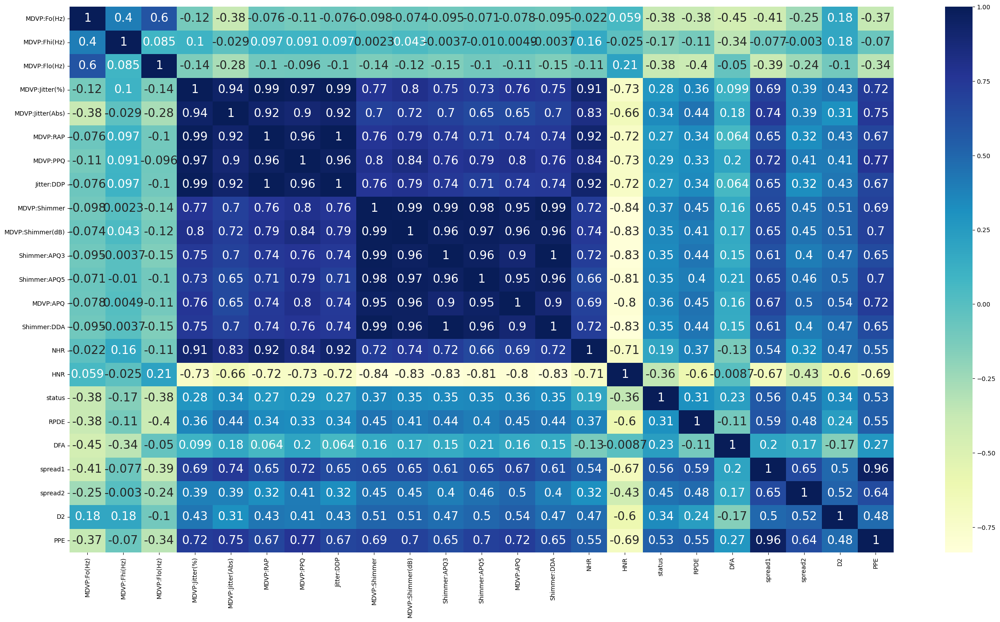

In [ ]:
plt.figure(figsize=(30,16))
sns.heatmap(data.corr(), annot = True, cmap = 'YlGnBu',annot_kws={'size':19})
plt.show()

****

## -- Scatter plot matrix

<Figure size 3000x3000 with 0 Axes>

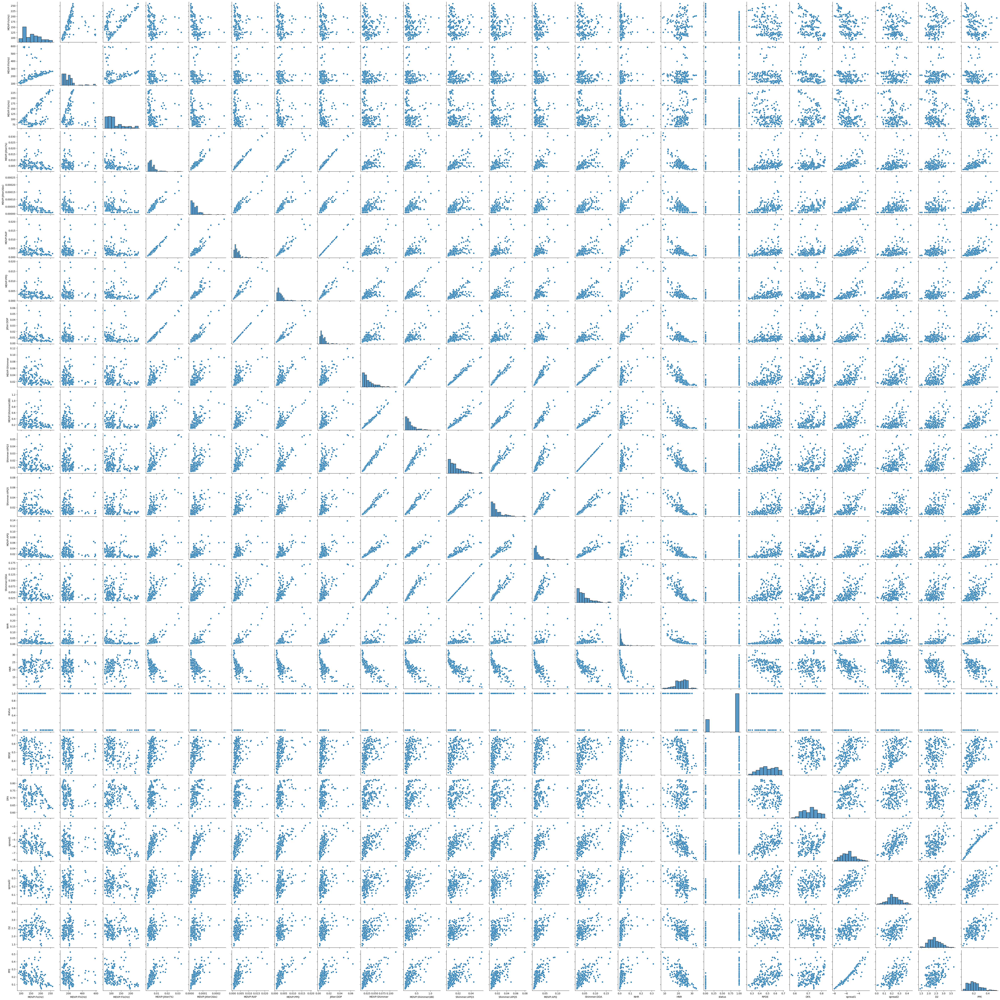

In [ ]:
plt.figure(figsize=(30,30))
sns.pairplot(data)

** **

## -- Visualizing the Regions Of Interest
### There is a high positive correleation between MDVP:Shimmer,MDVP:Shimmer(dB), Shimmer:APQ3, Shimmer:APQ5, MDVP:APQ, Shimmer:DDA

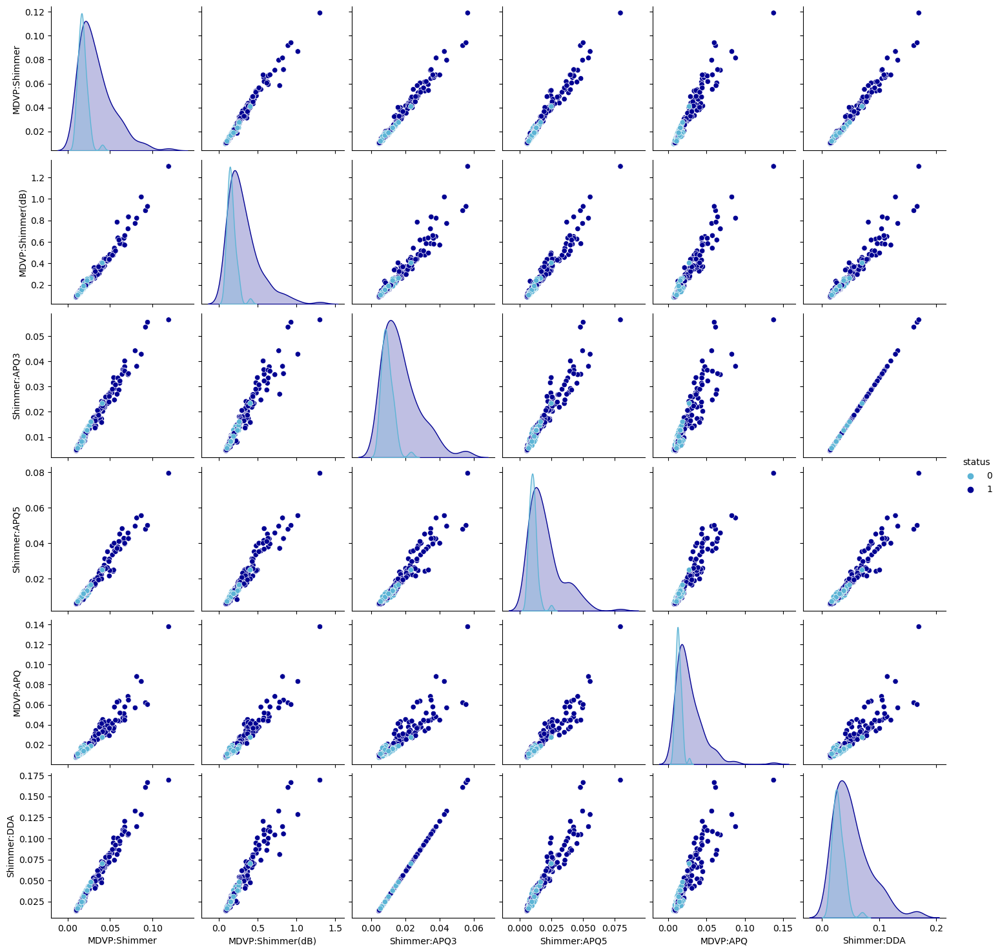

In [ ]:
sns.pairplot(data,palette=colors_1, hue="status", vars=["MDVP:Shimmer", "MDVP:Shimmer(dB)", "Shimmer:APQ3",
                                                      "Shimmer:APQ5", "MDVP:APQ","Shimmer:DDA"])
plt.show()

<hr>

### There is a high positive correleation between MDVP:Jitter(%), MDVP:Jitter(Abs), MDVP:RAP, MDVP:PPQ,  Jitter:DDP

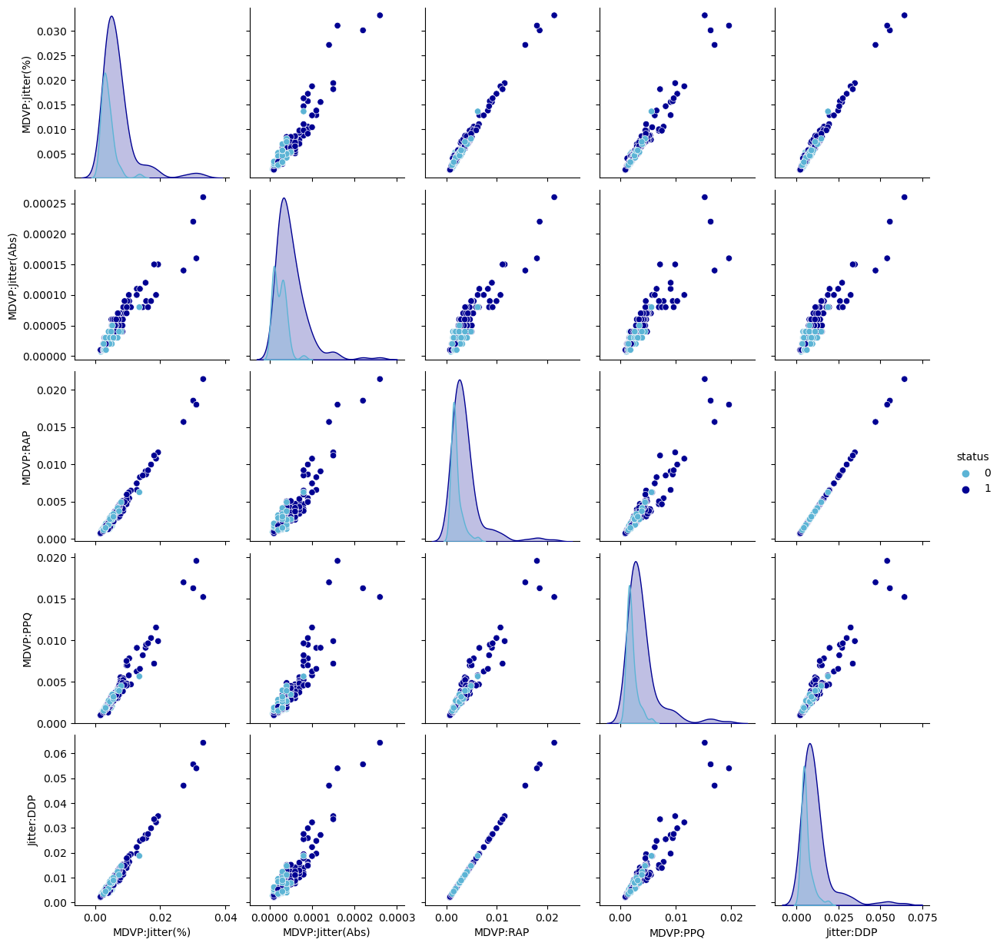

In [ ]:
sns.pairplot(data, palette=colors_1, hue="status", vars=["MDVP:Jitter(%)", "MDVP:Jitter(Abs)", "MDVP:RAP",
                                                      "MDVP:PPQ", "Jitter:DDP"])
plt.show()

****

### -- There is a high negative correlation between 'HNR' and all these features :
### { NHR, Shimmer:DDA, MDVP:APQ, Shimmer:APQ5, Shimmer:APQ3, MDVP:Shimmer(dB), MDVP:Shimmer, Jitter:DDP, MDVP:PPQ, MDVP:RAP, MDVP:Jitter(Abs), MDVP:Jitter(%) }
## As shown in the first row :

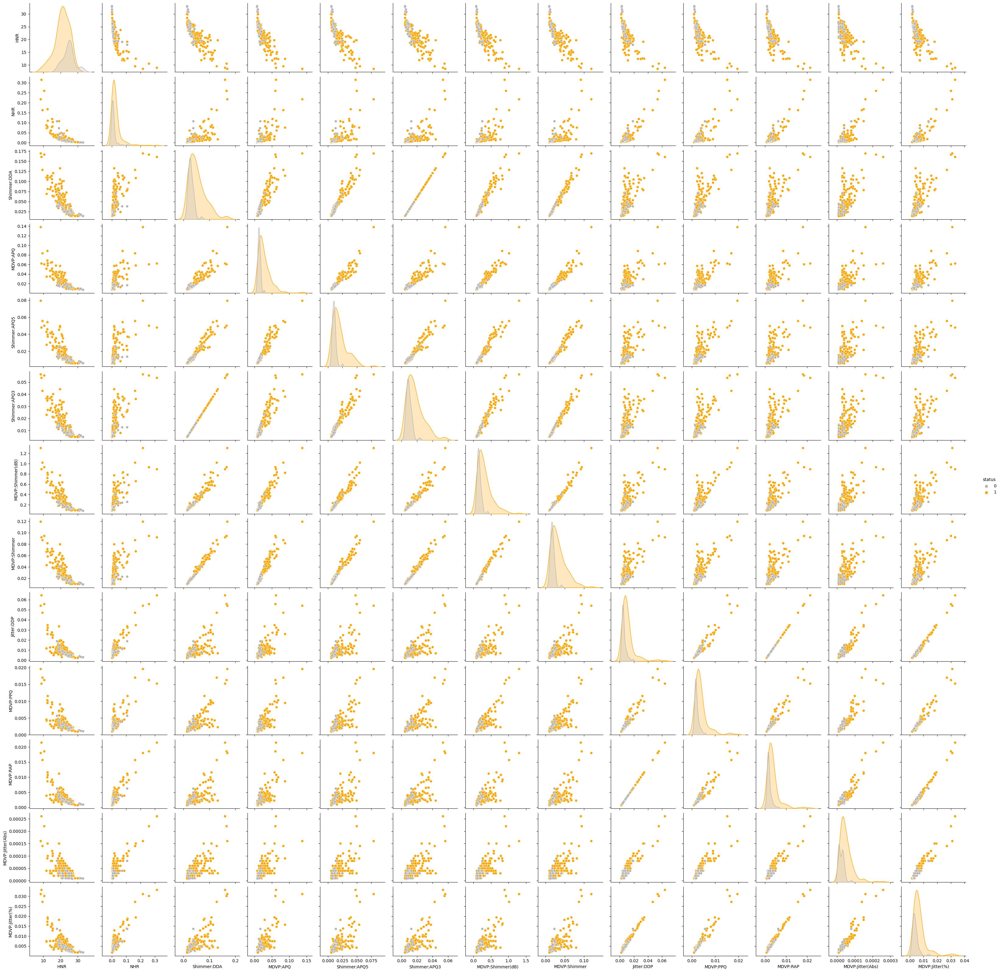

In [ ]:
sns.pairplot(data, palette=colors_2, hue="status", vars=["HNR", "NHR", "Shimmer:DDA", "MDVP:APQ",
                                                      "Shimmer:APQ5", "Shimmer:APQ3","MDVP:Shimmer(dB)",
                                                      "MDVP:Shimmer","Jitter:DDP","MDVP:PPQ",
                                                      "MDVP:RAP","MDVP:Jitter(Abs)","MDVP:Jitter(%)"])
plt.show()

****

## -- Uncovering and Mitigating Bias in PD Class-Imbalanced Dataset

**3/4 of the instances given are parkinson's patients and the other 1/4 are benign**

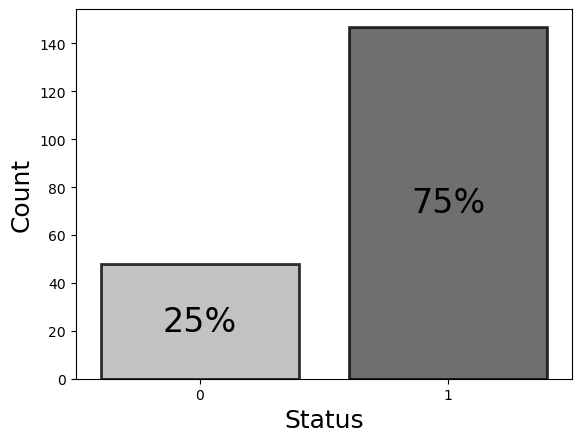

In [ ]:
palette = sns.color_palette(greys_1)
ax = sns.countplot(x='status', data=data, palette=palette, edgecolor='black', linewidth=2, alpha=0.8)
total = len(data['status'])

for p in ax.patches:
    percentage = '{:.0f}%'.format(100 * p.get_height() / total)
    x = p.get_x() + p.get_width() / 2
    y = p.get_y() + p.get_height() / 2
    ax.annotate(percentage, (x, y), ha='center', va='center', color='Black', fontsize=24)

ax.set_xlabel('Status', fontsize=18)
ax.set_ylabel('Count', fontsize=18)

plt.show()

**As shown in the above figure, The dataset appears to be unbalanced, with a significantly higher number of samples in Malignant category compared to the other.**

### To address the issue of class imbalance, we will use the following two techniques :

## - Random Under Sampler Technique
**The Random Under Sampler technique is a undersampling is used to balance a dataset by reducing the number of samples in the majority class,  This involves randomly selecting a subset of samples from the majority class such that the resulting dataset has a more balanced class distribution.**
## - SMOTE oversampling technique
**THe SMOTE Over Sampler technique is a oversampling used to address class imbalance, Oversampling involves increasing the number of samples in the minority class to match the number of samples in the majority class.**

****

# 4. Methodology

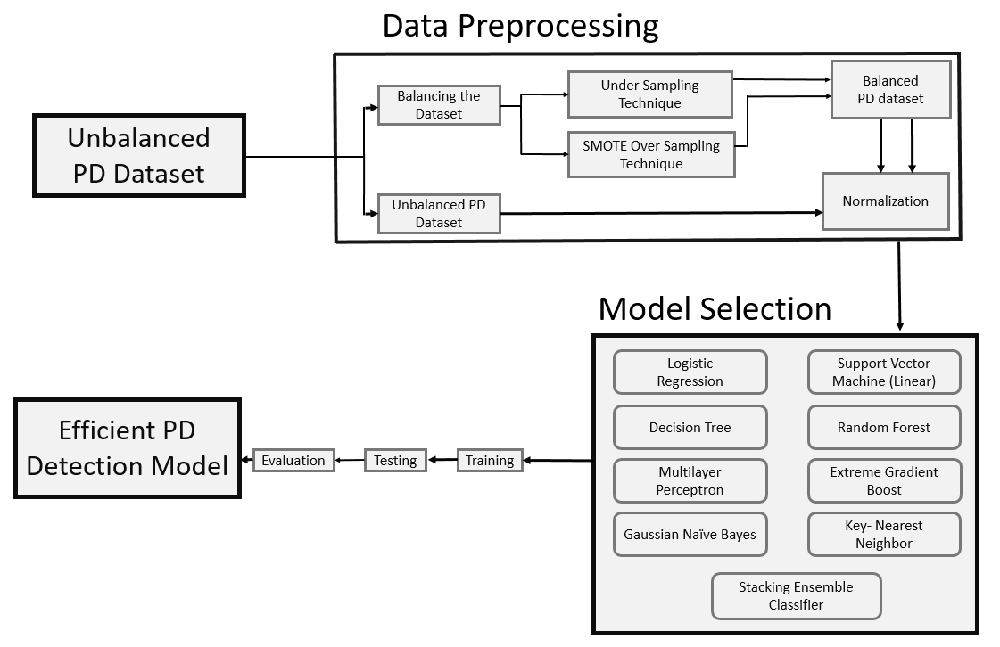

In [ ]:
Image('Methodology.png')

## 4.1 Data Preprocessing

### 4.1.1 Feature Engineering

**- X will refer to our input features.**

**- y will refer to the target feature[status].**

**- Without balancing the dataset**

In [ ]:
X=data.drop(['name','status'],axis=1)
y=data["status"]

### 4.1.2 Balancing the dataset

  **- UnderSampling Technique :**

In [ ]:
under_sampler = RandomUnderSampler(random_state=42)
X_under_sampled, y_under_sampled = under_sampler.fit_resample(X, y)
under_sampled_data = pd.concat([X_under_sampled, y_under_sampled], axis=1)

Text(0.5, 1.05, '*Under-sampled dataset*')

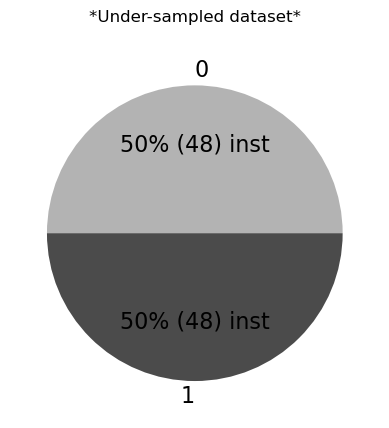

In [ ]:
num_status=under_sampled_data['status'].value_counts()
under_counts = num_status.values
plt.pie(num_status, labels=num_status.index.values, colors = greys_1, autopct=lambda n:
"{:.0f}% ({:.0f})".format(n, n/100*sum(under_counts)) +' inst', textprops={'fontsize': 16})
plt.title('*Under-sampled dataset*', y=1.05)

**- SMOTE OverSampling Technique :**

In [ ]:
smote_sampler = SMOTE(random_state=42)
X_smote, y_smote = smote_sampler.fit_resample(X, y)
smote_data = pd.concat([X_smote, y_smote], axis=1)

Text(0.5, 1.05, '*Over-sampled dataset*')

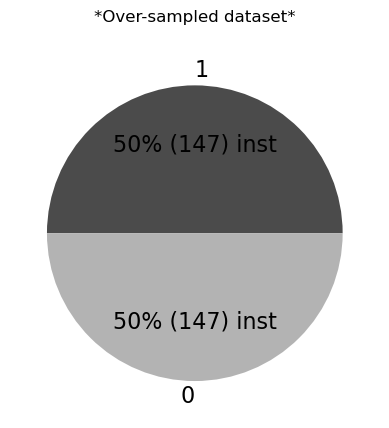

In [ ]:
num_status=smote_data['status'].value_counts()
over_counts = num_status.values
plt.pie(num_status, labels=num_status.index.values, colors = greys_1_flipped, autopct=lambda n:
"{:.0f}% ({:.0f})".format(n, n/100*sum(over_counts)) +' inst', textprops={'fontsize': 16})
plt.title('*Over-sampled dataset*', y=1.05)

###  4.1.3 Splitting the data into Training and Testing samples

#### -- Without balancing the data :

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

#### -- With Undersampling Technique :

In [ ]:
X_under_train, X_under_test, y_under_train, y_under_test = train_test_split(X_under_sampled, y_under_sampled, train_size=0.8, random_state=42)

#### -- With SMOTE Oversampling Technique :

In [ ]:
X_smote_train, X_smote_test, y_smote_train, y_smote_test = train_test_split(X_smote, y_smote, train_size=0.8, random_state=42)

###  4.1.4 Normalization
**Data normalization is a data preparation technique that is often applied to datasets while working with most of the machine learning algorithms. It changes the numeric values of columns without losing any information. It is required so as to re-scale the values of a particular feature in a specificrange. In this work, the feature values in the selected dataset were normalized using the Min-Max scaling methodbetween the range (0, 1) as these were of varying ranges.
This normalization may be described as follows :**

# $ MinMax(X) = \frac{x_{i} -  x_{min}} {x_{max} -  x_{min}}\ $
**where X is a particular feature represented by a column in
the dataset, xi is a value of this column where i is the number
of elements in the column. The minimum value of the
column is represented as Xmin and the maximum value of the
column is $X_{max}$.**

In [ ]:
X_train_scaled = minmax.fit_transform(X_train)
X_test_scaled = minmax.transform(X_test)

**After the Normalization, the model is implemented and output is produced in the form of probability or a class. The next step is to find out how efficient the model is using test dataset based on some metrics. In our work, to assess the classification performance different metrics like accuracy, recall, precision, F-1 score, and AUC-ROC curve have been used. Choosing the correct metrics to evaluate the machine learning model is very important as it influences how the performance is measured and compared.**

# 4.2 Model Selection
### Function to evaluate the performance of our models

In [ ]:
def Evaluate_Performance(Model, Xtrain, Xtest, Ytrain, Ytest) :
    Model.fit(Xtrain,Ytrain)
    Ypredicted = Model.predict(Xtest)
    print("\nTraining Accuracy Score : ", Model.score(Xtrain, Ytrain) * 100)
    print("Testing Accuracy Score : ", accuracy_score(Ytest, Ypredicted) * 100)
    print('Precision Score is :', precision_score(Ytest, Ypredicted) * 100)
    print('Recall Score is :', recall_score(Ytest, Ypredicted) * 100)
    print('F1-Score Score is :', f1_score(Ytest, Ypredicted) * 100)
    conf_matrix = confusion_matrix(Ytest,Ypredicted)
    sns.set(font_scale=1.4)
    sns.heatmap(conf_matrix, annot=True , cmap = plt.cm.Blues ,annot_kws={"size": 16})
    plt.show()
    print('-'*80)

## [1] Logistic Regression :

--------------------------------------------------------------------------------
Logistic Regression :
----------------

Training Accuracy Score :  85.25641025641025
Testing Accuracy Score :  89.74358974358975
Precision Score is : 88.88888888888889
Recall Score is : 100.0
F1-Score Score is : 94.11764705882352


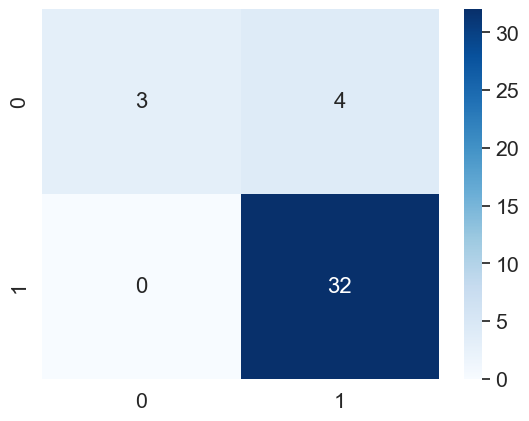

--------------------------------------------------------------------------------


In [ ]:
LR = LogisticRegression()
LR.fit(X_train_scaled,y_train)
y_pred_LR = LR.predict(X_test_scaled)
print('-'*80)
print("Logistic Regression :")
print("-"*16)
Evaluate_Performance(LR, X_train_scaled, X_test_scaled, y_train, y_test)

## [2] Support Vector Machine :

--------------------------------------------------------------------------------
Support Vector Machine:
----------------

Training Accuracy Score :  89.1025641025641
Testing Accuracy Score :  89.74358974358975
Precision Score is : 88.88888888888889
Recall Score is : 100.0
F1-Score Score is : 94.11764705882352


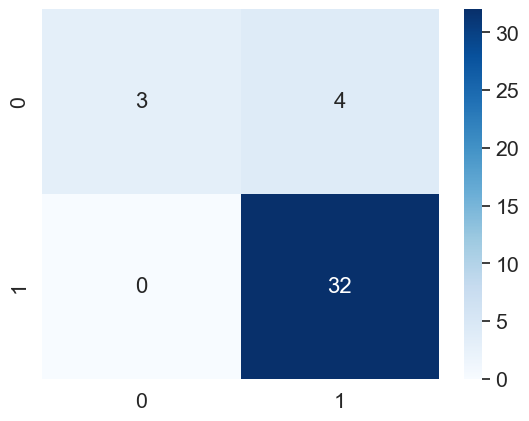

--------------------------------------------------------------------------------


In [ ]:
SVM = SVC(probability=True)
SVM.fit(X_train_scaled,y_train)
y_pred_SVM = SVM.predict(X_test_scaled)
print('-'*80)
print("Support Vector Machine:")
print("-"*16)
Evaluate_Performance(SVM, X_train_scaled, X_test_scaled, y_train, y_test)

## [3] Random Forest Classifier :

--------------------------------------------------------------------------------
Random Forest Classifier
----------------

Training Accuracy Score :  98.71794871794873
Testing Accuracy Score :  89.74358974358975
Precision Score is : 93.75
Recall Score is : 93.75
F1-Score Score is : 93.75


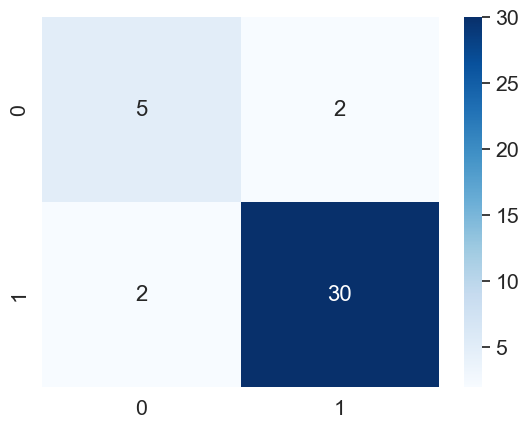

--------------------------------------------------------------------------------


In [ ]:
RFC=RandomForestClassifier(n_estimators = 6)
RFC.fit(X_train_scaled, y_train)
y_pred_RFC = RFC.predict(X_test_scaled)
print('-'*80)
print('Random Forest Classifier')
print("-"*16)
Evaluate_Performance(RFC, X_train_scaled, X_test_scaled, y_train, y_test)

## [4] Decision Tree :

--------------------------------------------------------------------------------
Decision Tree Classifier :
----------------

Training Accuracy Score :  100.0
Testing Accuracy Score :  92.3076923076923
Precision Score is : 93.93939393939394
Recall Score is : 96.875
F1-Score Score is : 95.38461538461539


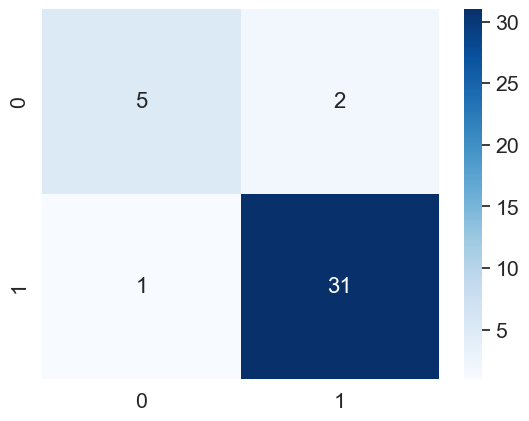

--------------------------------------------------------------------------------
--> Tree's Depth :  4 

DECISION TREE :


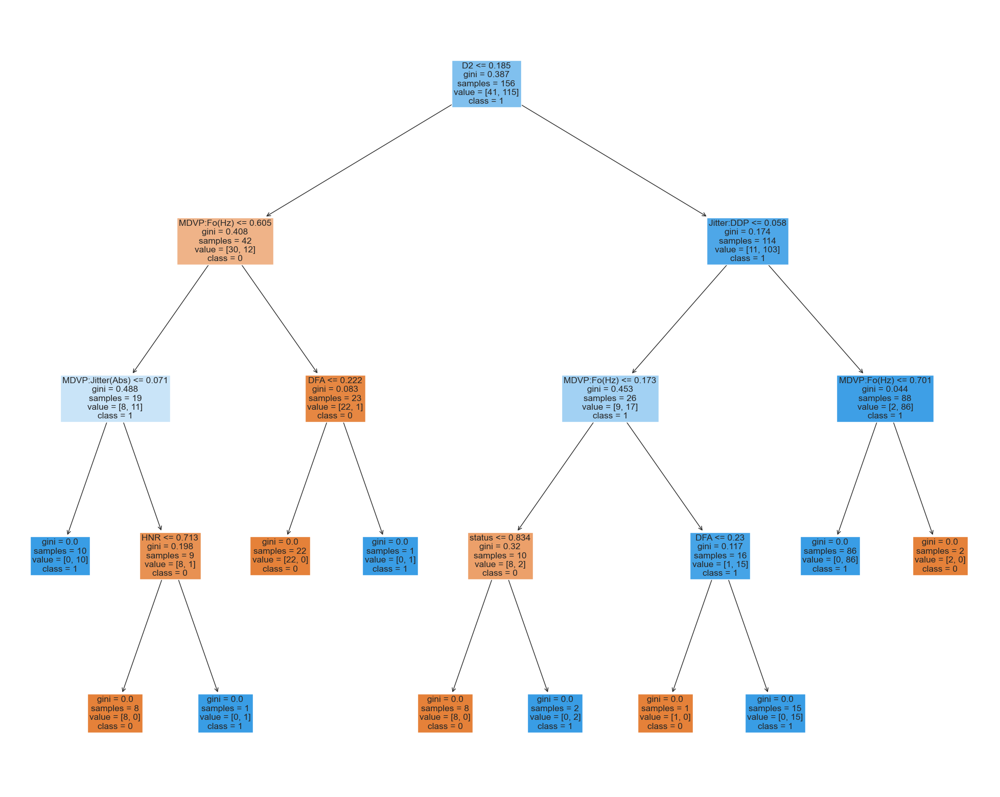

In [ ]:
DTC=DecisionTreeClassifier()
DTC.fit(X_train_scaled, y_train)
y_pred_DTC = DTC.predict(X_test_scaled)
print('-'*80)
print('Decision Tree Classifier :')
print("-"*16)
Evaluate_Performance(DTC, X_train_scaled, X_test_scaled, y_train, y_test)
print( '--> Tree\'s Depth : ',DTC.tree_.max_depth,'\n')
print("DECISION TREE :")
fig = plt.figure(figsize=(25,20))
tree = plot_tree(DTC, feature_names = [ c for c in data.drop(['name'],axis=1).columns], class_names=['0','1'], filled=True)

****

## [5] Extreme Gradient Boost (XGBoost)  :

--------------------------------------------------------------------------------
XGBoost Classifier :
----------------

Training Accuracy Score :  100.0
Testing Accuracy Score :  94.87179487179486
Precision Score is : 94.11764705882352
Recall Score is : 100.0
F1-Score Score is : 96.96969696969697


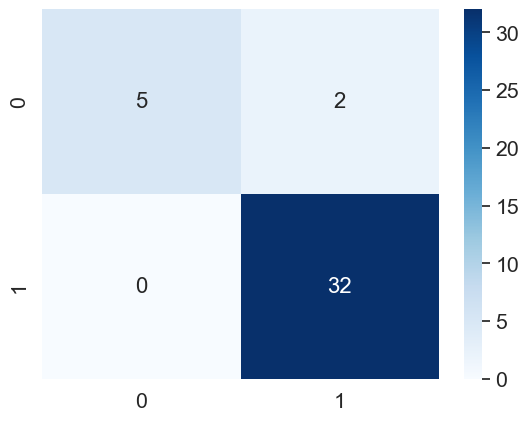

--------------------------------------------------------------------------------


In [ ]:
XGB = XGBClassifier()
XGB.fit(X_train_scaled, y_train)
y_pred_XGB = XGB.predict(X_test_scaled)
print('-'*80)
print('XGBoost Classifier :')
print("-"*16)
Evaluate_Performance(XGB, X_train_scaled, X_test_scaled, y_train, y_test)

## [6] Multilayer Perceptron Algorithm  :

--------------------------------------------------------------------------------
Multilayer perceptron :
----------------


C:\Users\mrwan\anaconda\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
C:\Users\mrwan\anaconda\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(



Training Accuracy Score :  86.53846153846155
Testing Accuracy Score :  87.17948717948718
Precision Score is : 88.57142857142857
Recall Score is : 96.875
F1-Score Score is : 92.53731343283582


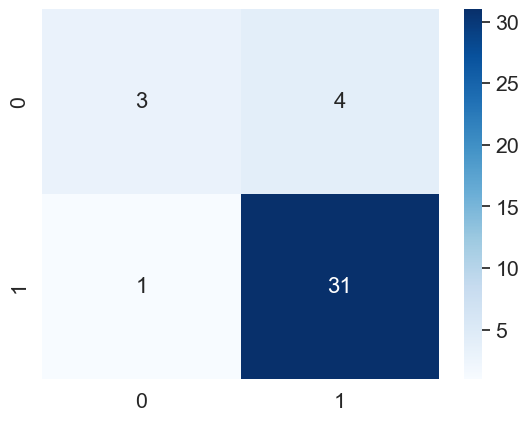

--------------------------------------------------------------------------------


In [ ]:
MLP = MLPClassifier()
MLP.fit(X_train_scaled, y_train)
y_pred_MLP = MLP.predict(X_test_scaled)
print('-'*80)
print("Multilayer perceptron :")
print("-"*16)
Evaluate_Performance(MLP, X_train_scaled, X_test_scaled, y_train, y_test)

## [7] Key- Nearest Neighbor :

--------------------------------------------------------------------------------
Key- Nearest Neighbor :
----------------

Training Accuracy Score :  96.7948717948718
Testing Accuracy Score :  94.87179487179486
Precision Score is : 94.11764705882352
Recall Score is : 100.0
F1-Score Score is : 96.96969696969697


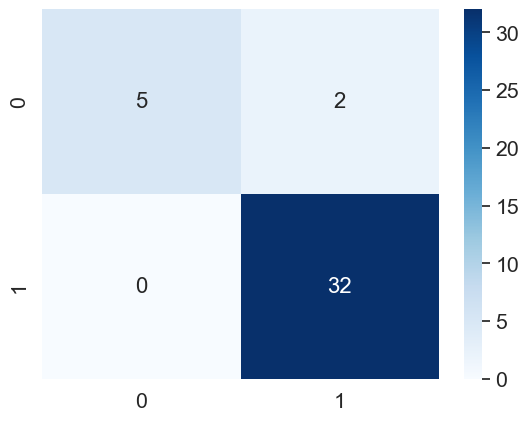

--------------------------------------------------------------------------------


In [ ]:
KNN = KNeighborsClassifier()
KNN.fit(X_train_scaled, y_train)
y_pred_KNN = KNN.predict(X_test_scaled)
print('-'*80)
print("Key- Nearest Neighbor :")
print("-"*16)
Evaluate_Performance(KNN, X_train_scaled, X_test_scaled, y_train, y_test)

## [8] Gaussian Naïve Bayes :

--------------------------------------------------------------------------------
Gaussian Naive Bayes :
----------------

Training Accuracy Score :  69.87179487179486
Testing Accuracy Score :  71.7948717948718
Precision Score is : 88.88888888888889
Recall Score is : 75.0
F1-Score Score is : 81.35593220338983


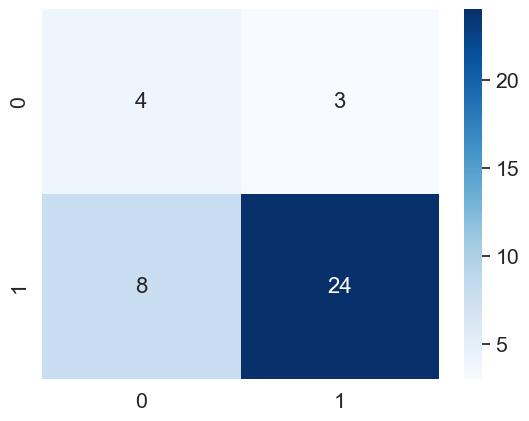

--------------------------------------------------------------------------------


In [ ]:
GNB = GaussianNB()
GNB.fit(X_train_scaled, y_train)
y_pred_GNB = GNB.predict(X_test_scaled)
print('-'*80)
print("Gaussian Naive Bayes :")
print("-"*16)
Evaluate_Performance(GNB, X_train_scaled, X_test_scaled, y_train, y_test)

## [9] Stacking Ensemble Classifier :

**A Stacking Ensemble Classifier is a type of meta-learner that combines several base classifiers to improve their performance. The algorithm trains the base classifiers on the training set and then uses their predictions as input to a meta-classifier [Final Estimator], which makes the final prediction.**

--------------------------------------------------------------------------------
Stacking Ensemble Classifier : 
----------------

Training Accuracy Score :  100.0
Testing Accuracy Score :  94.87179487179486
Precision Score is : 94.11764705882352
Recall Score is : 100.0
F1-Score Score is : 96.96969696969697


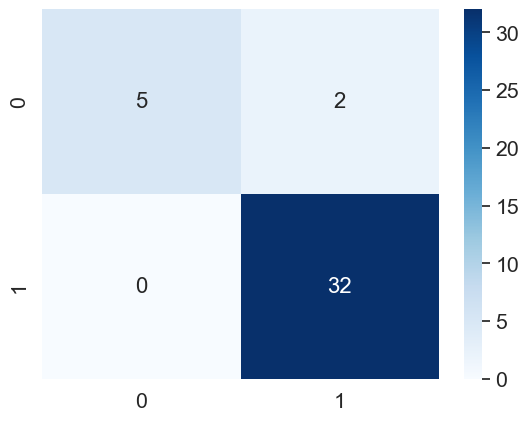

--------------------------------------------------------------------------------


In [ ]:
estimators = [ ('xgb', XGB ),
              ('log_Reg',LR ),
              ('svc', SVM)]

SEC = StackingClassifier(estimators=estimators ,final_estimator = SVM )
SEC.fit(X_train_scaled,y_train)
y_pred_SEC = SEC.predict(X_test_scaled)
print('-'*80)
print('Stacking Ensemble Classifier : ')
print("-"*16)
Evaluate_Performance(SEC, X_train_scaled, X_test_scaled, y_train, y_test)

****

# 5. Results

In [ ]:
results = [
    {'Model': 'Logistic Regression', 'Precision': precision_score(y_test, y_pred_LR) , 'Recall': recall_score(y_test, y_pred_LR),
     'F1-Score': f1_score(y_test, y_pred_LR), 'Training Accuracy': LR.score(X_train_scaled, y_train), 'Testing Accuracy': accuracy_score(y_test, y_pred_LR)},

    {'Model': 'Multilayer Perceptron', 'Precision': precision_score(y_test, y_pred_MLP), 'Recall': recall_score(y_test, y_pred_MLP),
     'F1-Score': f1_score(y_test, y_pred_MLP), 'Training Accuracy': MLP.score(X_train_scaled, y_train), 'Testing Accuracy': accuracy_score(y_test, y_pred_MLP)},

    {'Model': 'Gaussian Naïve Bayes', 'Precision': precision_score(y_test, y_pred_GNB), 'Recall': recall_score(y_test, y_pred_GNB),
     'F1-Score': f1_score(y_test, y_pred_GNB), 'Training Accuracy': GNB.score(X_train_scaled, y_train), 'Testing Accuracy': accuracy_score(y_test, y_pred_GNB)},

    {'Model': 'Support Vector Machine(linear)', 'Precision': precision_score(y_test, y_pred_SVM), 'Recall': recall_score(y_test, y_pred_SVM),
     'F1-Score': f1_score(y_test, y_pred_SVM), 'Training Accuracy': SVM.score(X_train_scaled, y_train), 'Testing Accuracy': accuracy_score(y_test, y_pred_SVM)},

    {'Model': 'Decision Tree', 'Precision': precision_score(y_test, y_pred_DTC), 'Recall': recall_score(y_test, y_pred_DTC),
     'F1-Score': f1_score(y_test, y_pred_DTC), 'Training Accuracy': DTC.score(X_train_scaled, y_train), 'Testing Accuracy': accuracy_score(y_test, y_pred_DTC)},

    {'Model': 'Random Forest', 'Precision': precision_score(y_test, y_pred_RFC), 'Recall': recall_score(y_test, y_pred_RFC),
     'F1-Score': f1_score(y_test, y_pred_RFC), 'Training Accuracy': RFC.score(X_train_scaled, y_train), 'Testing Accuracy': accuracy_score(y_test, y_pred_RFC)},

    {'Model': 'XGBoost', 'Precision': precision_score(y_test, y_pred_XGB), 'Recall': recall_score(y_test, y_pred_XGB),
     'F1-Score': f1_score(y_test, y_pred_XGB), 'Training Accuracy': XGB.score(X_train_scaled, y_train), 'Testing Accuracy': accuracy_score(y_test, y_pred_XGB)},

    {'Model': 'Stacking Ensemble Classifier', 'Precision': precision_score(y_test, y_pred_SEC), 'Recall': recall_score(y_test, y_pred_SEC),
     'F1-Score': f1_score(y_test, y_pred_SEC), 'Training Accuracy': SEC.score(X_train_scaled, y_train), 'Testing Accuracy': accuracy_score(y_test, y_pred_SEC)},

    {'Model': 'K-Nearest Neighbor', 'Precision': precision_score(y_test, y_pred_KNN), 'Recall': recall_score(y_test, y_pred_KNN),
     'F1-Score': f1_score(y_test, y_pred_KNN), 'Training Accuracy': KNN.score(X_train_scaled, y_train), 'Testing Accuracy': accuracy_score(y_test, y_pred_KNN)},

]
results = pd.DataFrame(results).style.set_properties(**{'font-weight': 'bold'}, subset=pd.IndexSlice[[5,6,7,8], :])
print("Results without balancing the dataset : ")
print('-'*70)
results

Results without balancing the dataset : 
----------------------------------------------------------------------


,Model,Precision,Recall,F1-Score,Training Accuracy,Testing Accuracy
0,Logistic Regression,0.888889,1.000000,0.941176,0.852564,0.897436
1,Multilayer Perceptron,0.888889,1.000000,0.941176,0.865385,0.897436
2,Gaussian Naïve Bayes,0.888889,0.750000,0.813559,0.698718,0.717949
3,Support Vector Machine(linear),0.888889,1.000000,0.941176,0.891026,0.897436
4,Decision Tree,0.939394,0.968750,0.953846,1.000000,0.923077
5,Random Forest,0.937500,0.937500,0.937500,0.987179,0.897436
6,XGBoost,0.941176,1.000000,0.969697,1.000000,0.948718
7,Stacking Ensemble Classifier,0.941176,1.000000,0.969697,1.000000,0.948718
8,K-Nearest Neighbor,0.941176,1.000000,0.969697,0.967949,0.948718


****

# Applying the RandomUnderSampler Technique, then evaluating our models

In [ ]:
X_under_train_scaled = minmax.fit_transform(X_under_train)
X_under_test_scaled = minmax.fit_transform(X_under_test)

## [1] Logistic Regression

--------------------------------------------------------------------------------
Logistic Regression :
----------------

Training Accuracy Score :  78.94736842105263
Testing Accuracy Score :  70.0
Precision Score is : 61.53846153846154
Recall Score is : 88.88888888888889
F1-Score Score is : 72.72727272727273


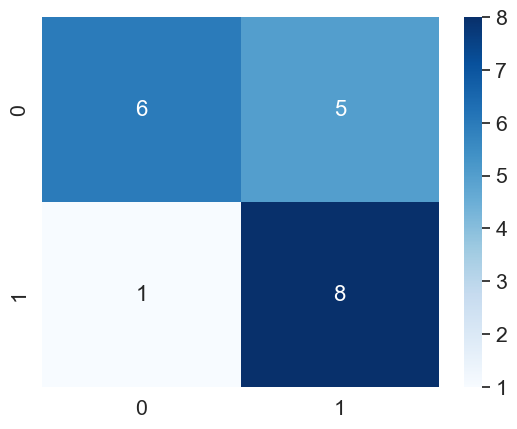

--------------------------------------------------------------------------------


In [ ]:
LR.fit(X_under_train_scaled,y_under_train)
y_pred_LR = LR.predict(X_under_test_scaled)
print('-'*80)
print("Logistic Regression :")
print("-"*16)
Evaluate_Performance(LR, X_under_train_scaled, X_under_test_scaled, y_under_train, y_under_test)

## [2] Support vector machine

--------------------------------------------------------------------------------
Support Vector Machine:
----------------

Training Accuracy Score :  88.1578947368421
Testing Accuracy Score :  65.0
Precision Score is : 58.333333333333336
Recall Score is : 77.77777777777779
F1-Score Score is : 66.66666666666666


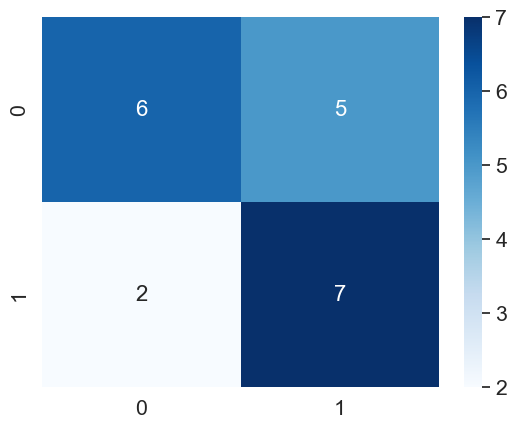

--------------------------------------------------------------------------------


In [ ]:
SVM.fit(X_under_train_scaled,y_under_train)
y_pred_SVM = SVM.predict(X_under_test_scaled)
print('-'*80)
print("Support Vector Machine:")
print("-"*16)
Evaluate_Performance(SVM, X_under_train_scaled, X_under_test_scaled, y_under_train, y_under_test)

## [3] Random Forest Classifier

--------------------------------------------------------------------------------
Random Forest Classifier :
----------------

Training Accuracy Score :  98.68421052631578
Testing Accuracy Score :  75.0
Precision Score is : 70.0
Recall Score is : 77.77777777777779
F1-Score Score is : 73.68421052631578


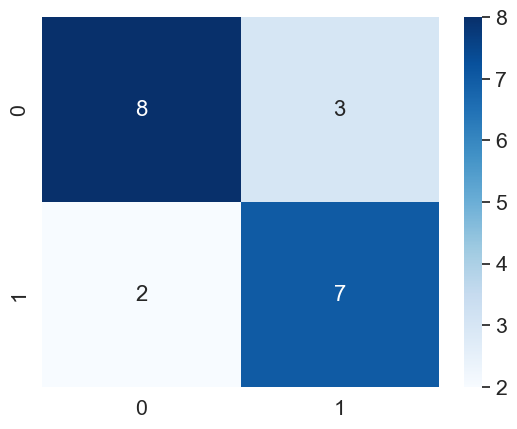

--------------------------------------------------------------------------------


In [ ]:
RFC.fit(X_under_train_scaled,y_under_train)
y_pred_RFC = RFC.predict(X_under_test_scaled)
print('-'*80)
print("Random Forest Classifier :")
print("-"*16)
Evaluate_Performance(RFC, X_under_train_scaled, X_under_test_scaled, y_under_train, y_under_test)

## [4] Decision Tree

--------------------------------------------------------------------------------
Decision Tree Classifier :
----------------

Training Accuracy Score :  100.0
Testing Accuracy Score :  60.0
Precision Score is : 54.54545454545454
Recall Score is : 66.66666666666666
F1-Score Score is : 60.0


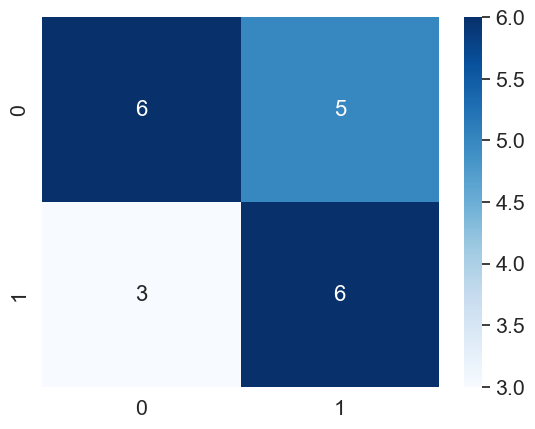

--------------------------------------------------------------------------------
--> Tree's Depth :  4 

DECISION TREE :


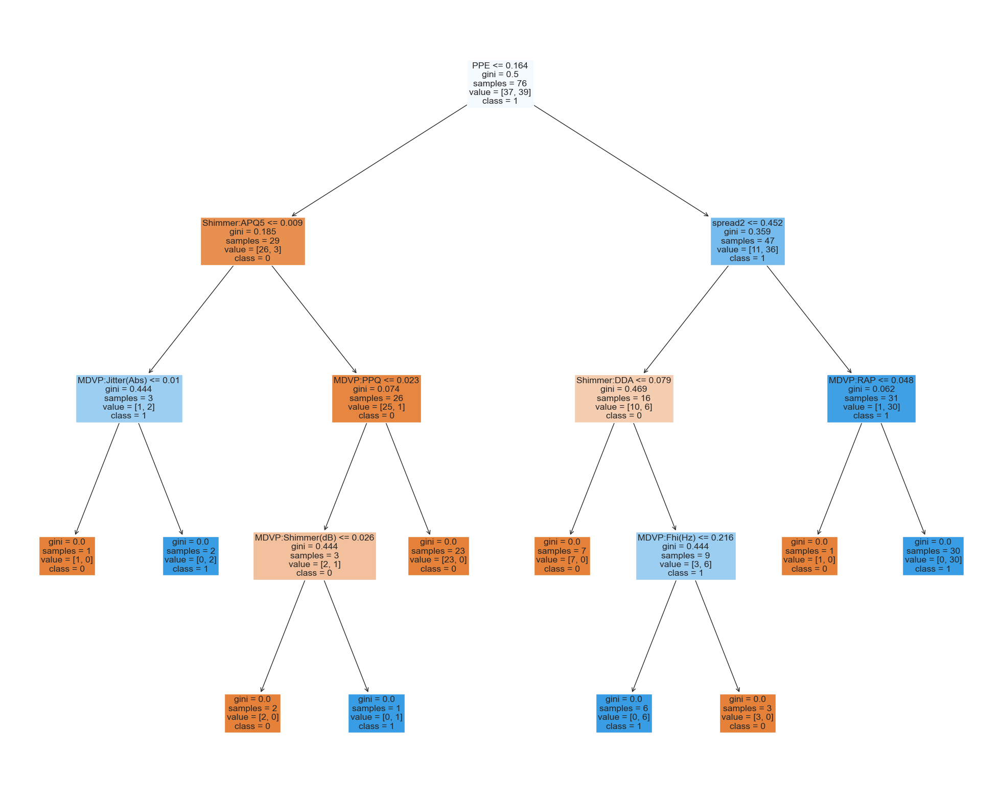

In [ ]:
DTC.fit(X_under_train_scaled,y_under_train)
y_pred_DTC = DTC.predict(X_under_test_scaled)
print('-'*80)
print("Decision Tree Classifier :")
print("-"*16)
Evaluate_Performance(DTC, X_under_train_scaled, X_under_test_scaled, y_under_train, y_under_test)
print( '--> Tree\'s Depth : ',DTC.tree_.max_depth,'\n')
print("DECISION TREE :")
fig = plt.figure(figsize=(25,20))
tree = plot_tree(DTC, feature_names = [ c for c in under_sampled_data.columns], class_names=['0','1'], filled=True)

## [5] Extreme Gradient Boost (XGBoost)  

--------------------------------------------------------------------------------
Extreme Gradient Boost :
----------------

Training Accuracy Score :  100.0
Testing Accuracy Score :  70.0
Precision Score is : 63.63636363636363
Recall Score is : 77.77777777777779
F1-Score Score is : 70.0


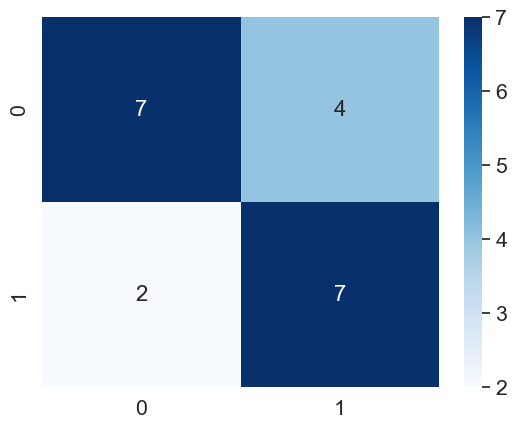

--------------------------------------------------------------------------------


In [ ]:
XGB.fit(X_under_train_scaled,y_under_train)
y_pred_XGB = XGB.predict(X_under_test_scaled)
print('-'*80)
print("Extreme Gradient Boost :")
print("-"*16)
Evaluate_Performance(XGB, X_under_train_scaled, X_under_test_scaled, y_under_train, y_under_test)

## [6] Multilayer perceptron Algorithm  

--------------------------------------------------------------------------------
Extreme Gradient Boost :
----------------

Training Accuracy Score :  84.21052631578947
Testing Accuracy Score :  70.0
Precision Score is : 61.53846153846154
Recall Score is : 88.88888888888889
F1-Score Score is : 72.72727272727273


C:\Users\mrwan\anaconda\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
C:\Users\mrwan\anaconda\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


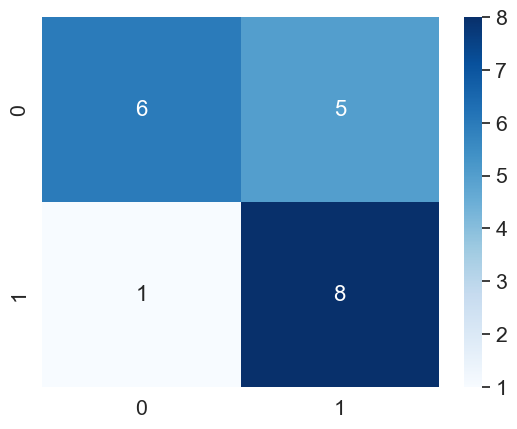

--------------------------------------------------------------------------------


In [ ]:
MLP.fit(X_under_train_scaled,y_under_train)
y_pred_MLP = MLP.predict(X_under_test_scaled)
print('-'*80)
print("Extreme Gradient Boost :")
print("-"*16)
Evaluate_Performance(MLP, X_under_train_scaled, X_under_test_scaled, y_under_train, y_under_test)

## [7] Key- Nearest Neighbor

--------------------------------------------------------------------------------
Key- Nearest Neighbor :
----------------

Training Accuracy Score :  98.68421052631578
Testing Accuracy Score :  75.0
Precision Score is : 70.0
Recall Score is : 77.77777777777779
F1-Score Score is : 73.68421052631578


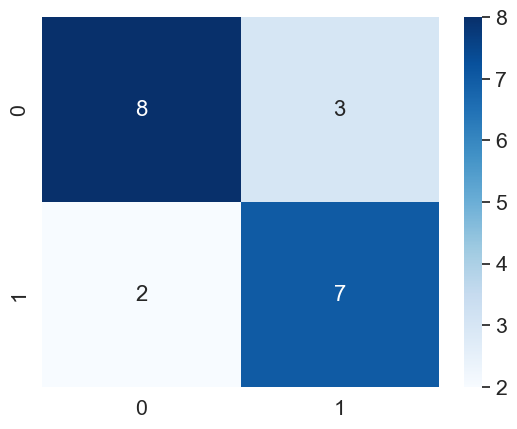

--------------------------------------------------------------------------------


In [ ]:
KNN.fit(X_under_train_scaled,y_under_train)
y_pred_KNN_under = KNN.predict(X_under_test_scaled)
print('-'*80)
print("Key- Nearest Neighbor :")
print("-"*16)
Evaluate_Performance(KNN, X_under_train_scaled, X_under_test_scaled, y_under_train, y_under_test)

## [8] Gaussian Naive Bayes

--------------------------------------------------------------------------------
Gaussian Naive Bayes :
----------------

Training Accuracy Score :  77.63157894736842
Testing Accuracy Score :  60.0
Precision Score is : 53.84615384615385
Recall Score is : 77.77777777777779
F1-Score Score is : 63.63636363636363


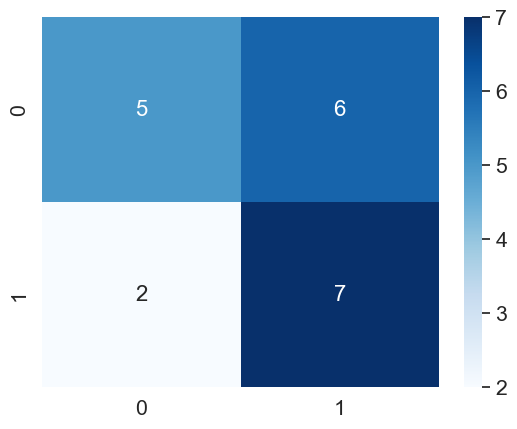

--------------------------------------------------------------------------------


In [ ]:
GNB.fit(X_under_train_scaled,y_under_train)
y_pred_GNB = GNB.predict(X_under_test_scaled)
print('-'*80)
print("Gaussian Naive Bayes :")
print("-"*16)
Evaluate_Performance(GNB, X_under_train_scaled, X_under_test_scaled, y_under_train, y_under_test)

## [9] Stacking Ensemble Classifier

--------------------------------------------------------------------------------
Stacking Ensemble Classifier :
----------------

Training Accuracy Score :  100.0
Testing Accuracy Score :  70.0
Precision Score is : 63.63636363636363
Recall Score is : 77.77777777777779
F1-Score Score is : 70.0


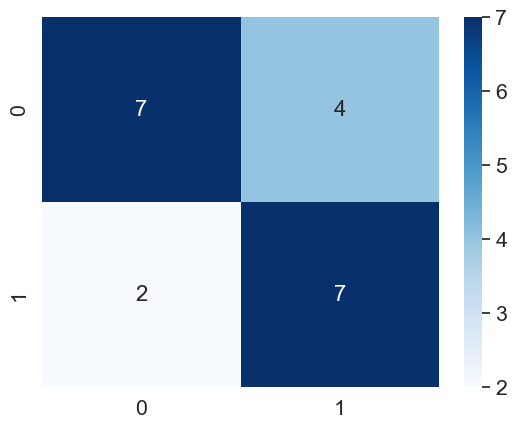

--------------------------------------------------------------------------------


In [ ]:
SEC.fit(X_under_train_scaled,y_under_train)
y_pred_SEC = SEC.predict(X_under_test_scaled)
print('-'*80)
print("Stacking Ensemble Classifier :")
print("-"*16)
Evaluate_Performance(SEC, X_under_train_scaled, X_under_test_scaled, y_under_train, y_under_test)

### * Most of the models overfitted the undersampled data strongly

In [ ]:
results = [
    {'Model': 'Logistic Regression', 'Precision': precision_score(y_under_test, y_pred_LR) , 'Recall': recall_score(y_under_test, y_pred_LR),
     'F1-Score': f1_score(y_under_test, y_pred_LR), 'Training Accuracy': LR.score(X_under_train_scaled, y_under_train), 'Testing Accuracy': accuracy_score(y_under_test, y_pred_LR)},

    {'Model': 'Multilayer Perceptron', 'Precision': precision_score(y_under_test, y_pred_MLP), 'Recall': recall_score(y_under_test, y_pred_MLP),
     'F1-Score': f1_score(y_under_test, y_pred_MLP), 'Training Accuracy': MLP.score(X_under_train_scaled, y_under_train), 'Testing Accuracy': accuracy_score(y_under_test, y_pred_MLP)},

    {'Model': 'Gaussian Naïve Bayes', 'Precision': precision_score(y_under_test, y_pred_GNB), 'Recall': recall_score(y_under_test, y_pred_GNB),
     'F1-Score': f1_score(y_under_test, y_pred_GNB), 'Training Accuracy': GNB.score(X_under_train_scaled, y_under_train), 'Testing Accuracy': accuracy_score(y_under_test, y_pred_GNB)},

    {'Model': 'Support Vector Machine(linear)', 'Precision': precision_score(y_under_test, y_pred_SVM), 'Recall': recall_score(y_under_test, y_pred_SVM),
     'F1-Score': f1_score(y_under_test, y_pred_SVM), 'Training Accuracy': SVM.score(X_under_train_scaled, y_under_train), 'Testing Accuracy': accuracy_score(y_under_test, y_pred_SVM)},

    {'Model': 'Decision Tree', 'Precision': precision_score(y_under_test, y_pred_DTC), 'Recall': recall_score(y_under_test, y_pred_DTC),
     'F1-Score': f1_score(y_under_test, y_pred_DTC), 'Training Accuracy': DTC.score(X_under_train_scaled, y_under_train), 'Testing Accuracy': accuracy_score(y_under_test, y_pred_DTC)},

    {'Model': 'Random Forest', 'Precision': precision_score(y_under_test, y_pred_RFC), 'Recall': recall_score(y_under_test, y_pred_RFC),
     'F1-Score': f1_score(y_under_test, y_pred_RFC), 'Training Accuracy': RFC.score(X_under_train_scaled, y_under_train), 'Testing Accuracy': accuracy_score(y_under_test, y_pred_RFC)},

    {'Model': 'XGBoost', 'Precision': precision_score(y_under_test, y_pred_XGB), 'Recall': recall_score(y_under_test, y_pred_XGB),
     'F1-Score': f1_score(y_under_test, y_pred_XGB), 'Training Accuracy': XGB.score(X_under_train_scaled, y_under_train), 'Testing Accuracy': accuracy_score(y_under_test, y_pred_XGB)},

    {'Model': 'Stacking Ensemble Classifier', 'Precision': precision_score(y_under_test, y_pred_SEC), 'Recall': recall_score(y_under_test, y_pred_SEC),
     'F1-Score': f1_score(y_under_test, y_pred_SEC), 'Training Accuracy': SEC.score(X_under_train_scaled, y_under_train), 'Testing Accuracy': accuracy_score(y_under_test, y_pred_SEC)},

    {'Model': 'K-Nearest Neighbor', 'Precision': precision_score(y_under_test, y_pred_KNN_under), 'Recall': recall_score(y_under_test, y_pred_KNN_under),
     'F1-Score': f1_score(y_under_test, y_pred_KNN_under), 'Training Accuracy': KNN.score(X_under_train_scaled, y_under_train), 'Testing Accuracy': accuracy_score(y_under_test, y_pred_KNN_under)},
]
undersampled_results = pd.DataFrame(results).style.set_properties(**{'font-weight': 'bold'}, subset=pd.IndexSlice[[8], :])
print("Results after balancing the dataset using RandomUnderSampler technique : ")
print('-'*70)
undersampled_results

Results after balancing the dataset using RandomUnderSampler technique : 
----------------------------------------------------------------------


,Model,Precision,Recall,F1-Score,Training Accuracy,Testing Accuracy
0,Logistic Regression,0.615385,0.888889,0.727273,0.789474,0.700000
1,Multilayer Perceptron,0.615385,0.888889,0.727273,0.842105,0.700000
2,Gaussian Naïve Bayes,0.538462,0.777778,0.636364,0.776316,0.600000
3,Support Vector Machine(linear),0.583333,0.777778,0.666667,0.881579,0.650000
4,Decision Tree,0.636364,0.777778,0.700000,1.000000,0.700000
5,Random Forest,0.615385,0.888889,0.727273,0.986842,0.700000
6,XGBoost,0.636364,0.777778,0.700000,1.000000,0.700000
7,Stacking Ensemble Classifier,0.636364,0.777778,0.700000,1.000000,0.700000
8,K-Nearest Neighbor,0.700000,0.777778,0.736842,0.986842,0.750000


<hr style = >

# Applying The SMOTE Technique, then evaluating our models

In [ ]:
X_smote_train_scaled = minmax.fit_transform(X_smote_train)
X_smote_test_scaled = minmax.fit_transform(X_smote_test)

## [1] Logistic Regression

--------------------------------------------------------------------------------
Logistic Regression :
----------------

Training Accuracy Score :  80.0
Testing Accuracy Score :  83.05084745762711
Precision Score is : 75.67567567567568
Recall Score is : 96.55172413793103
F1-Score Score is : 84.84848484848484


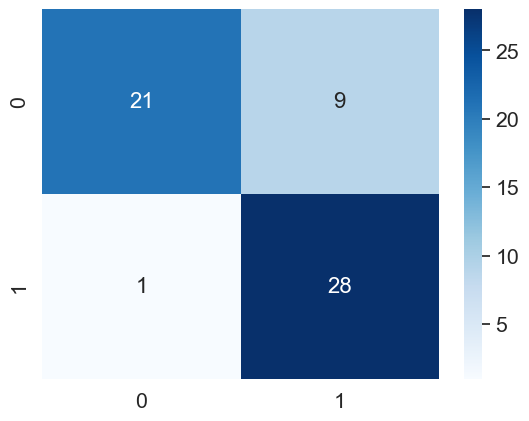

--------------------------------------------------------------------------------


In [ ]:
LR.fit(X_smote_train_scaled,y_smote_train)
y_pred_LR_smote = LR.predict(X_smote_test_scaled)
print('-'*80)
print("Logistic Regression :")
print("-"*16)
Evaluate_Performance(LR, X_smote_train_scaled, X_smote_test_scaled, y_smote_train, y_smote_test)

## [2] Support vector machine

--------------------------------------------------------------------------------
Support vector machine :
----------------

Training Accuracy Score :  91.06382978723404
Testing Accuracy Score :  96.61016949152543
Precision Score is : 93.54838709677419
Recall Score is : 100.0
F1-Score Score is : 96.66666666666666


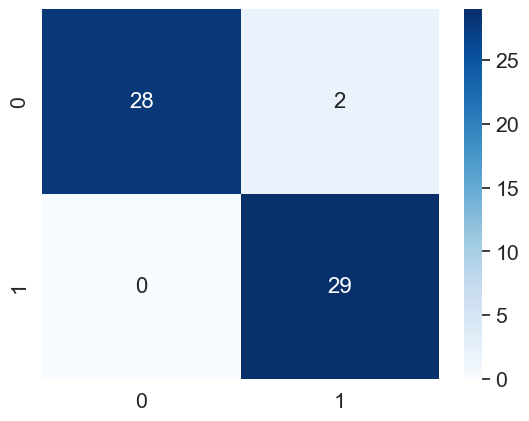

--------------------------------------------------------------------------------


In [ ]:
SVM.fit(X_smote_train_scaled,y_smote_train)
y_pred_SVM_smote = SVM.predict(X_smote_test_scaled)
print('-'*80)
print("Support vector machine :")
print("-"*16)
Evaluate_Performance(SVM, X_smote_train_scaled, X_smote_test_scaled, y_smote_train, y_smote_test)

## [3] Random Forest Classifier

--------------------------------------------------------------------------------
Random Forest Classifier :
----------------

Training Accuracy Score :  98.72340425531915
Testing Accuracy Score :  88.13559322033898
Precision Score is : 89.28571428571429
Recall Score is : 86.20689655172413
F1-Score Score is : 87.71929824561403


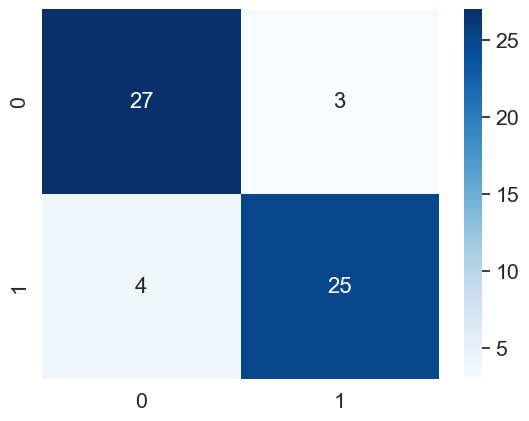

--------------------------------------------------------------------------------


In [ ]:
RFC.fit(X_smote_train_scaled,y_smote_train)
y_pred_RFC_smote = RFC.predict(X_smote_test_scaled)
print('-'*80)
print("Random Forest Classifier :")
print("-"*16)
Evaluate_Performance(RFC, X_smote_train_scaled, X_smote_test_scaled, y_smote_train, y_smote_test)

## [4] Decision Tree

--------------------------------------------------------------------------------
Decision Tree Classifier :
----------------

Training Accuracy Score :  100.0
Testing Accuracy Score :  93.22033898305084
Precision Score is : 90.32258064516128
Recall Score is : 96.55172413793103
F1-Score Score is : 93.33333333333333


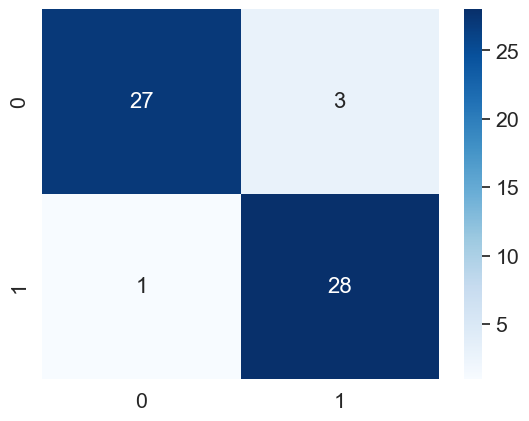

--------------------------------------------------------------------------------
--> Tree's Depth :  6 

DECISION TREE :


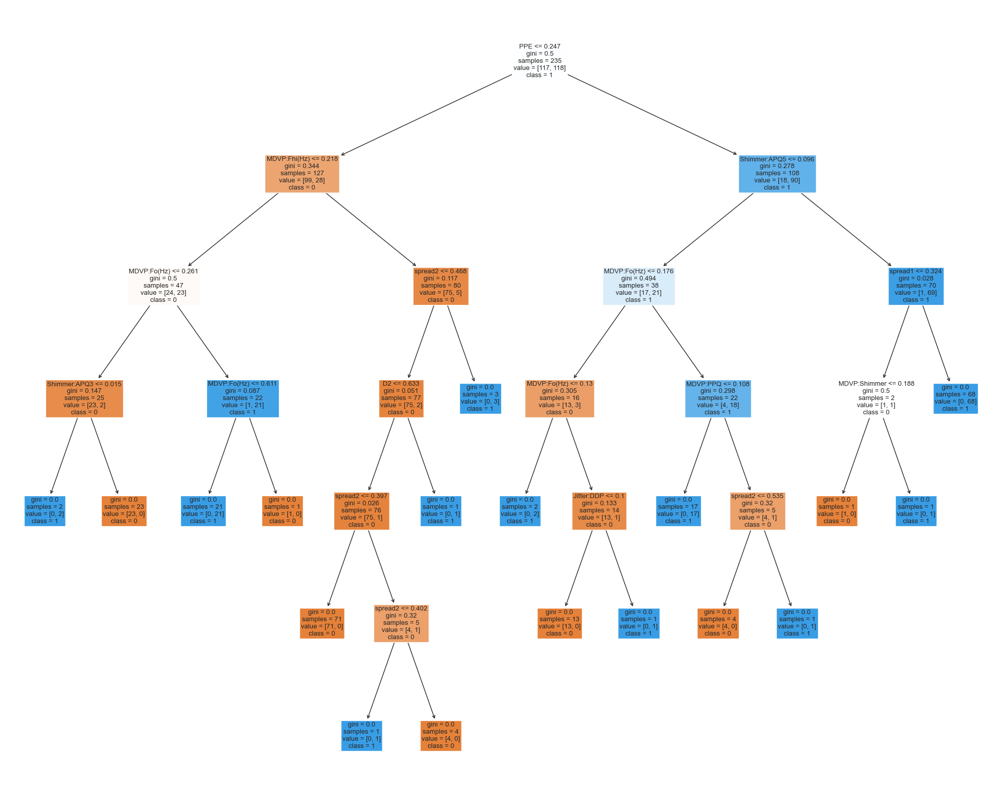

In [ ]:
DTC.fit(X_smote_train_scaled,y_smote_train)
y_pred_DTC_smote = DTC.predict(X_smote_test_scaled)
print('-'*80)
print("Decision Tree Classifier :")
print("-"*16)
Evaluate_Performance(DTC, X_smote_train_scaled, X_smote_test_scaled, y_smote_train, y_smote_test)
print( '--> Tree\'s Depth : ',DTC.tree_.max_depth,'\n')
print("DECISION TREE :")
fig = plt.figure(figsize=(25,20))
tree = plot_tree(DTC, feature_names = [ c for c in smote_data.columns], class_names=['0','1'], filled=True)
plt.show()

 ## [5] Extreme Gradient Boost (XGBoost)  

--------------------------------------------------------------------------------
Extreme Gradient Boost :
----------------

Training Accuracy Score :  100.0
Testing Accuracy Score :  94.91525423728814
Precision Score is : 90.625
Recall Score is : 100.0
F1-Score Score is : 95.08196721311475


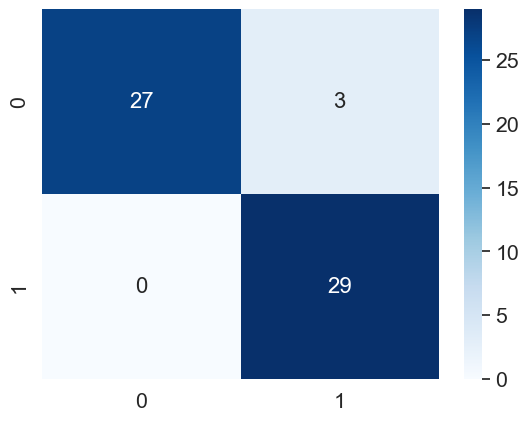

--------------------------------------------------------------------------------


In [ ]:
XGB.fit(X_smote_train_scaled,y_smote_train)
y_pred_XGB_smote = XGB.predict(X_smote_test_scaled)
print('-'*80)
print("Extreme Gradient Boost :")
print("-"*16)
Evaluate_Performance(XGB, X_smote_train_scaled, X_smote_test_scaled, y_smote_train, y_smote_test)

## [6] Multilayer perceptron Algorithm  

--------------------------------------------------------------------------------
Multilayer perceptron Algorithm :
----------------


C:\Users\mrwan\anaconda\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
C:\Users\mrwan\anaconda\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(



Training Accuracy Score :  81.70212765957446
Testing Accuracy Score :  83.05084745762711
Precision Score is : 78.78787878787878
Recall Score is : 89.65517241379311
F1-Score Score is : 83.87096774193549


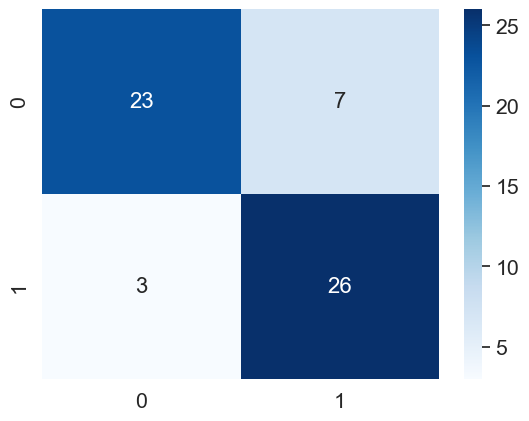

--------------------------------------------------------------------------------


In [ ]:
MLP.fit(X_smote_train_scaled,y_smote_train)
y_pred_MLP_smote = MLP.predict(X_smote_test_scaled)
print('-'*80)
print("Multilayer perceptron Algorithm :")
print("-"*16)
Evaluate_Performance(MLP, X_smote_train_scaled, X_smote_test_scaled, y_smote_train, y_smote_test)

## [7] Key- Nearest Neighbor

--------------------------------------------------------------------------------
Key- Nearest Neighbor :
----------------

Training Accuracy Score :  100.0
Testing Accuracy Score :  98.30508474576271
Precision Score is : 100.0
Recall Score is : 96.55172413793103
F1-Score Score is : 98.24561403508771


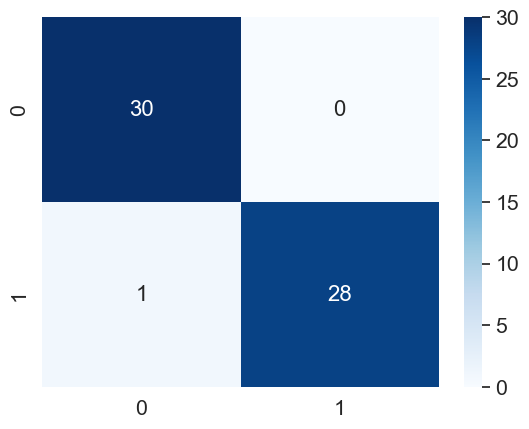

--------------------------------------------------------------------------------


In [ ]:
SupremeKNN = KNeighborsClassifier( n_neighbors = 1 )
SupremeKNN.fit(X_smote_train_scaled,y_smote_train)
y_pred_SupremeKNN_smote = SupremeKNN.predict(X_smote_test_scaled)
print('-'*80)
print("Key- Nearest Neighbor :")
print("-"*16)
Evaluate_Performance(SupremeKNN, X_smote_train_scaled, X_smote_test_scaled, y_smote_train, y_smote_test)

# --> Finding the best k value using GridSearchCV

In [ ]:
k_values = [1, 3, 5, 7, 9]
param_grid = {'n_neighbors': k_values}
GS = GridSearchCV(KNN, param_grid, cv=5)
GS.fit(X_smote_train_scaled, y_smote_train)

print("Most Optimal n_neighbors(k_value) value :", GS.best_params_['n_neighbors'])
print("Accuracy Test score:", GS.score(X_smote_test_scaled, y_smote_test))

Most Optimal n_neighbors(k_value) value : 1
Accuracy Test score: 0.9830508474576272


## [8] Gaussian Naive Bayes

--------------------------------------------------------------------------------
Gaussian Naive Bayes :
----------------

Training Accuracy Score :  76.17021276595744
Testing Accuracy Score :  83.05084745762711
Precision Score is : 77.14285714285715
Recall Score is : 93.10344827586206
F1-Score Score is : 84.37500000000001


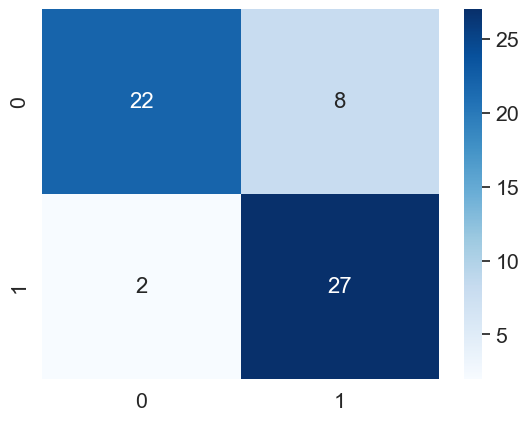

--------------------------------------------------------------------------------


In [ ]:
GNB.fit(X_smote_train_scaled,y_smote_train)
y_pred_GNB_smote = GNB.predict(X_smote_test_scaled)
print('-'*80)
print("Gaussian Naive Bayes :")
print("-"*16)
Evaluate_Performance(GNB, X_smote_train_scaled, X_smote_test_scaled, y_smote_train, y_smote_test)

## [9] Stacking Ensemble Classifier

--------------------------------------------------------------------------------
Stacking Ensemble Classifier :
----------------

Training Accuracy Score :  100.0
Testing Accuracy Score :  94.91525423728814
Precision Score is : 90.625
Recall Score is : 100.0
F1-Score Score is : 95.08196721311475


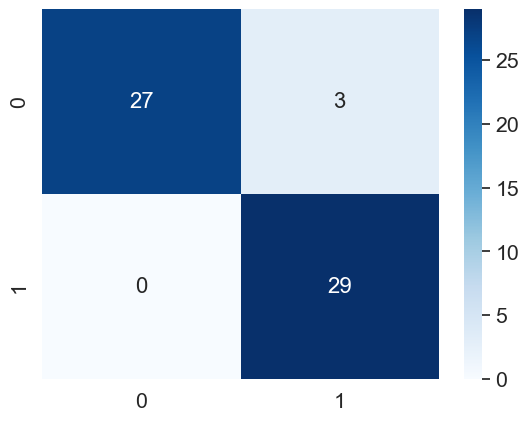

--------------------------------------------------------------------------------


In [ ]:
SEC.fit(X_smote_train_scaled,y_smote_train)
y_pred_SEC_smote = SEC.predict(X_smote_test_scaled)
print('-'*80)
print("Stacking Ensemble Classifier :")
print("-"*16)
Evaluate_Performance(SEC, X_smote_train_scaled, X_smote_test_scaled, y_smote_train, y_smote_test)

In [ ]:
results = [
    {'Model': 'Logistic Regression', 'Precision': precision_score(y_smote_test, y_pred_LR_smote) , 'Recall': recall_score(y_smote_test, y_pred_LR_smote) ,
     'F1-Score': f1_score(y_smote_test, y_pred_LR_smote) ,'Training Accuracy': LR.score(X_smote_train_scaled, y_smote_train), 'Test Accuracy': accuracy_score(y_smote_test, y_pred_LR_smote)},

    {'Model': 'Multilayer Perceptron', 'Precision': precision_score(y_smote_test, y_pred_MLP_smote), 'Recall': recall_score(y_smote_test, y_pred_MLP_smote),
     'F1-Score': f1_score(y_smote_test, y_pred_MLP_smote),'Training Accuracy': MLP.score(X_smote_train_scaled, y_smote_train), 'Test Accuracy': accuracy_score(y_smote_test, y_pred_MLP_smote)},

    {'Model': 'Gaussian Naïve Bayes', 'Precision': precision_score(y_smote_test, y_pred_GNB_smote), 'Recall': recall_score(y_smote_test, y_pred_GNB_smote),
     'F1-Score': f1_score(y_smote_test, y_pred_GNB_smote),'Training Accuracy': GNB.score(X_smote_train_scaled, y_smote_train), 'Test Accuracy': accuracy_score(y_smote_test, y_pred_GNB_smote)},

    {'Model': 'Support Vector Machine(linear)', 'Precision': precision_score(y_smote_test, y_pred_SVM_smote), 'Recall': recall_score(y_smote_test, y_pred_SVM_smote),
     'F1-Score': f1_score(y_smote_test, y_pred_SVM_smote),'Training Accuracy': SVM.score(X_smote_train_scaled, y_smote_train), 'Test Accuracy': accuracy_score(y_smote_test, y_pred_SVM_smote)},

    {'Model': 'Decision Tree', 'Precision': precision_score(y_smote_test, y_pred_DTC_smote), 'Recall': recall_score(y_smote_test, y_pred_DTC_smote),
     'F1-Score': f1_score(y_smote_test, y_pred_DTC_smote),'Training Accuracy': DTC.score(X_smote_train_scaled, y_smote_train), 'Test Accuracy': accuracy_score(y_smote_test, y_pred_DTC_smote)},

    {'Model': 'Random Forest', 'Precision': precision_score(y_smote_test, y_pred_RFC_smote), 'Recall': recall_score(y_smote_test, y_pred_RFC_smote),
     'F1-Score': f1_score(y_smote_test, y_pred_RFC_smote),'Training Accuracy': RFC.score(X_smote_train_scaled, y_smote_train), 'Test Accuracy': accuracy_score(y_smote_test, y_pred_RFC_smote)},

    {'Model': 'XGBoost', 'Precision': precision_score(y_smote_test, y_pred_XGB_smote), 'Recall': recall_score(y_smote_test, y_pred_XGB_smote),
     'F1-Score': f1_score(y_smote_test, y_pred_XGB_smote),'Training Accuracy': XGB.score(X_smote_train_scaled, y_smote_train), 'Test Accuracy': accuracy_score(y_smote_test, y_pred_XGB_smote)},

    {'Model': 'Stacking Ensemble Classifier', 'Precision': precision_score(y_smote_test, y_pred_SEC_smote), 'Recall': recall_score(y_smote_test, y_pred_SEC_smote),
     'F1-Score': f1_score(y_smote_test, y_pred_SEC_smote),'Training Accuracy': SEC.score(X_smote_train_scaled, y_smote_train) ,'Test Accuracy': accuracy_score(y_smote_test, y_pred_SEC_smote)},

    {'Model': 'K-Nearest Neighbor', 'Precision': precision_score(y_smote_test, y_pred_SupremeKNN_smote), 'Recall': recall_score(y_smote_test, y_pred_SupremeKNN_smote),
     'F1-Score': f1_score(y_smote_test, y_pred_SupremeKNN_smote),'Training Accuracy': SupremeKNN.score(X_smote_train_scaled, y_smote_train), 'Test Accuracy': accuracy_score(y_smote_test, y_pred_SupremeKNN_smote)},
]
smote_results = pd.DataFrame(results).style.set_properties(**{'font-weight': 'bold'}, subset=pd.IndexSlice[[8], :])
print("Results after balancing the dataset using SMOTE Over Sampler technique : ")
print('-'*70)
smote_results

Results after balancing the dataset using SMOTE Over Sampler technique : 
----------------------------------------------------------------------


,Model,Precision,Recall,F1-Score,Training Accuracy,Test Accuracy
0,Logistic Regression,0.756757,0.965517,0.848485,0.800000,0.830508
1,Multilayer Perceptron,0.862069,0.862069,0.862069,0.817021,0.864407
2,Gaussian Naïve Bayes,0.771429,0.931034,0.843750,0.761702,0.830508
3,Support Vector Machine(linear),0.935484,1.000000,0.966667,0.910638,0.966102
4,Decision Tree,0.931034,0.931034,0.931034,1.000000,0.932203
5,Random Forest,0.823529,0.965517,0.888889,0.987234,0.881356
6,XGBoost,0.906250,1.000000,0.950820,1.000000,0.949153
7,Stacking Ensemble Classifier,0.906250,1.000000,0.950820,1.000000,0.949153
8,K-Nearest Neighbor,1.000000,0.965517,0.982456,1.000000,0.983051


****
****
****

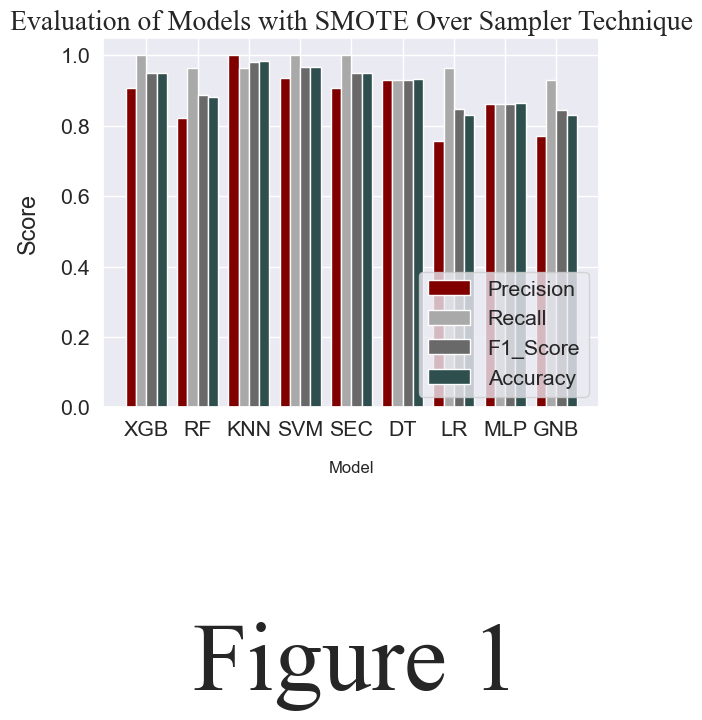

In [ ]:
results = {
        'XGB' : [precision_score(y_smote_test, y_pred_XGB_smote), recall_score(y_smote_test, y_pred_XGB_smote),
             f1_score(y_smote_test, y_pred_XGB_smote), accuracy_score(y_smote_test, y_pred_XGB_smote)],

        'RF' : [precision_score(y_smote_test, y_pred_RFC_smote), recall_score(y_smote_test, y_pred_RFC_smote),
             f1_score(y_smote_test, y_pred_RFC_smote), accuracy_score(y_smote_test, y_pred_RFC_smote)],

        'KNN' : [precision_score(y_smote_test, y_pred_SupremeKNN_smote), recall_score(y_smote_test, y_pred_SupremeKNN_smote),
             f1_score(y_smote_test, y_pred_SupremeKNN_smote), accuracy_score(y_smote_test, y_pred_SupremeKNN_smote)],

        'SVM' : [precision_score(y_smote_test, y_pred_SVM_smote), recall_score(y_smote_test, y_pred_SVM_smote),
             f1_score(y_smote_test, y_pred_SVM_smote), accuracy_score(y_smote_test, y_pred_SVM_smote)],

        'SEC' : [precision_score(y_smote_test, y_pred_SEC_smote),recall_score(y_smote_test, y_pred_SEC_smote),
             f1_score(y_smote_test, y_pred_SEC_smote),accuracy_score(y_smote_test, y_pred_SEC_smote)],

        'DT' : [precision_score(y_smote_test, y_pred_DTC_smote), recall_score(y_smote_test, y_pred_DTC_smote),
             f1_score(y_smote_test, y_pred_DTC_smote), accuracy_score(y_smote_test, y_pred_DTC_smote)],

        'LR' : [precision_score(y_smote_test, y_pred_LR_smote), recall_score(y_smote_test, y_pred_LR_smote),
             f1_score(y_smote_test, y_pred_LR_smote), accuracy_score(y_smote_test, y_pred_LR_smote)],

        'MLP' : [precision_score(y_smote_test, y_pred_MLP_smote), recall_score(y_smote_test, y_pred_MLP_smote),
             f1_score(y_smote_test, y_pred_MLP_smote), accuracy_score(y_smote_test, y_pred_MLP_smote)],

        'GNB' : [precision_score(y_smote_test, y_pred_GNB_smote), recall_score(y_smote_test, y_pred_GNB_smote),
             f1_score(y_smote_test, y_pred_GNB_smote), accuracy_score(y_smote_test, y_pred_GNB_smote)]
}

model_names = list(results)

x_positions = np.arange(len(model_names))

plt.bar(x_positions - 0.2*1.5, [results[name][0] for name in model_names], width=0.2, label='Precision', color = 'maroon')
plt.bar(x_positions - 0.2*0.5, [results[name][1] for name in model_names], width=0.2, label='Recall', color = 'darkgrey')
plt.bar(x_positions + 0.2*0.5, [results[name][2] for name in model_names], width=0.2, label='F1_Score', color = 'dimgrey')
plt.bar(x_positions + 0.2*1.5, [results[name][3] for name in model_names], width=0.2, label='Accuracy', color = 'darkslategrey')

plt.xlabel('Model', labelpad=15, fontsize=12)
plt.ylabel('Score', labelpad=15)
plt.legend(loc='lower right')

font_title = FontProperties()
font_title.set_family('serif')
font_title.set_name('Times New Roman')
font_title.set_size(20)

plt.title('Evaluation of Models with SMOTE Over Sampler Technique', fontproperties=font_title)

font_footer = FontProperties()
font_footer.set_family('serif')
font_footer.set_name('Times New Roman')
font_footer.set_size(70)
plt.text(0.9, -0.8, 'Figure 1', fontproperties=font_footer)

plt.xticks(x_positions, model_names)
plt.show()

Text(0, -0.8, 'Figure 2')

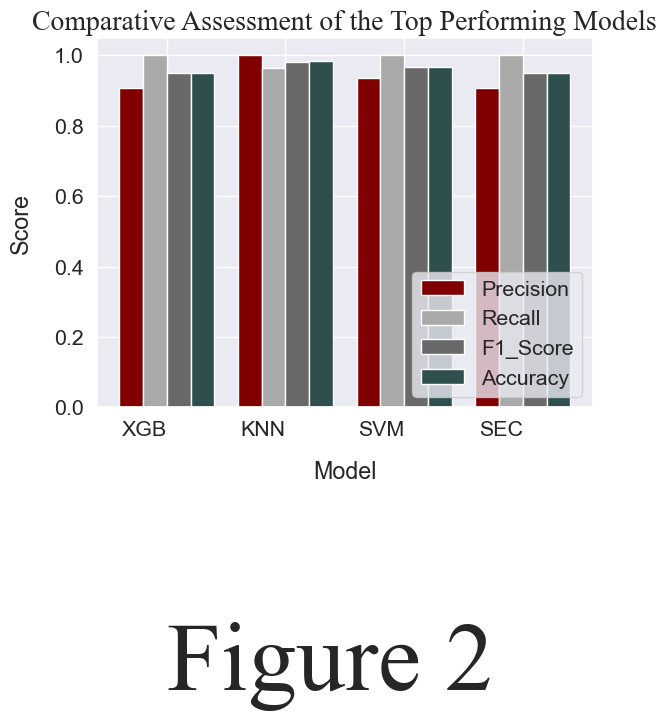

In [ ]:
best_results = {
                'XGB' : [precision_score(y_smote_test, y_pred_XGB_smote),recall_score(y_smote_test, y_pred_XGB_smote),
                f1_score(y_smote_test, y_pred_XGB_smote),accuracy_score(y_smote_test, y_pred_XGB_smote)],

                'KNN' : [precision_score(y_smote_test, y_pred_SupremeKNN_smote),recall_score(y_smote_test, y_pred_SupremeKNN_smote),
                f1_score(y_smote_test, y_pred_SupremeKNN_smote),accuracy_score(y_smote_test, y_pred_SupremeKNN_smote)],

                'SVM' : [precision_score(y_smote_test, y_pred_SVM_smote), recall_score(y_smote_test, y_pred_SVM_smote),
                f1_score(y_smote_test, y_pred_SVM_smote), accuracy_score(y_smote_test, y_pred_SVM_smote)],

                'SEC' : [precision_score(y_smote_test, y_pred_SEC_smote),recall_score(y_smote_test, y_pred_SEC_smote),
                f1_score(y_smote_test, y_pred_SEC_smote),accuracy_score(y_smote_test, y_pred_SEC_smote)],
    }
model_names = list(best_results.keys())
precision_scores = [best_results[name][0] for name in model_names]
recall_scores = [best_results[name][1] for name in model_names]
f1_scores = [best_results[name][2] for name in model_names]
accuracy_scores = [best_results[name][3] for name in model_names]
bar_width = 0.2

x_positions = np.arange(len(model_names))

plt.bar(x_positions - 0.2*1.5, precision_scores, width=0.2, label='Precision', color = 'maroon')
plt.bar(x_positions - 0.2*0.5, recall_scores, width=0.2, label='Recall', color = 'darkgrey')
plt.bar(x_positions + 0.2*0.5, f1_scores, width=0.2, label='F1_Score', color = 'dimgrey')
plt.bar(x_positions + 0.2*1.5, accuracy_scores, width=0.2, label='Accuracy', color = 'darkslategrey')

plt.xlabel('Model', labelpad=15)
plt.ylabel('Score', labelpad=15)
plt.xticks(x_positions, model_names, ha='right')
plt.legend(loc = 'lower right')
plt.title('Comparative Assessment of the Top Performing Models', fontproperties=font_title)
plt.text(0, -0.8, 'Figure 2', fontproperties=font_footer)


Text(-1, -0.7, 'Comprehensive Comparison of proposed 9 Machine Learning Models with ROC Curve Analysis ')

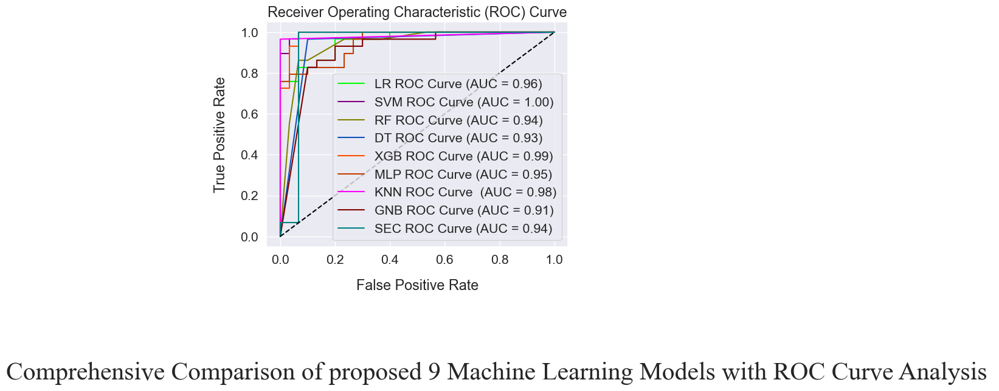

In [ ]:
y_pred_prob_LR_smt =LR.predict_proba(X_smote_test_scaled)[:, 1]
fpr_LR_smt, tpr_LR_smt, thresholds_LR_smt = roc_curve(y_smote_test, y_pred_prob_LR_smt)
roc_auc_LR_smt = auc(fpr_LR_smt, tpr_LR_smt)

y_pred_prob_SVM_smt =SVM.predict_proba(X_smote_test_scaled)[:, 1]
fpr_SVM_smt, tpr_SVM_smt, thresholds_SVM_smt = roc_curve(y_smote_test, y_pred_prob_SVM_smt)
roc_auc_SVM_smt = auc(fpr_SVM_smt, tpr_SVM_smt)

y_pred_prob_RFC_smt =RFC.predict_proba(X_smote_test_scaled)[:, 1]
fpr_RFC_smt, tpr_RFC_smt, thresholds_RFC_smt = roc_curve(y_smote_test, y_pred_prob_RFC_smt)
roc_auc_RFC_smt = auc(fpr_RFC_smt, tpr_RFC_smt)

y_pred_prob_DTC_smt =DTC.predict_proba(X_smote_test_scaled)[:, 1]
fpr_DTC_smt, tpr_DTC_smt, thresholds_DTC_smt = roc_curve(y_smote_test, y_pred_prob_DTC_smt)
roc_auc_DTC_smt = auc(fpr_DTC_smt, tpr_DTC_smt)

y_pred_prob_XGB_smt =XGB.predict_proba(X_smote_test_scaled)[:, 1]
fpr_XGB_smt, tpr_XGB_smt, thresholds_XGB_smt = roc_curve(y_smote_test, y_pred_prob_XGB_smt)
roc_auc_XGB_smt = auc(fpr_XGB_smt, tpr_XGB_smt)

y_pred_prob_MLP_smt =MLP.predict_proba(X_smote_test_scaled)[:, 1]
fpr_MLP_smt, tpr_MLP_smt, thresholds_MLP_smt = roc_curve(y_smote_test, y_pred_prob_MLP_smt)
roc_auc_MLP_smt = auc(fpr_MLP_smt, tpr_MLP_smt)

y_pred_prob_GNB_smt =GNB.predict_proba(X_smote_test_scaled)[:, 1]
fpr_GNB_smt, tpr_GNB_smt, thresholds_GNB_smt = roc_curve(y_smote_test, y_pred_prob_GNB_smt)
roc_auc_GNB_smt = auc(fpr_GNB_smt, tpr_GNB_smt)

y_pred_prob_KNN_smt =SupremeKNN.predict_proba(X_smote_test_scaled)[:, 1]
fpr_KNN_smt, tpr_KNN_smt, thresholds_knn_smt = roc_curve(y_smote_test, y_pred_prob_KNN_smt)
roc_auc_KNN_smt = auc(fpr_KNN_smt, tpr_KNN_smt)

y_pred_prob_MLP_smt =MLP.predict_proba(X_smote_test_scaled)[:, 1]
fpr_MLP_smt, tpr_MLP_smt, thresholds_MLP_smt = roc_curve(y_smote_test, y_pred_prob_MLP_smt)
roc_auc_MLP_smt = auc(fpr_MLP_smt, tpr_MLP_smt)

y_pred_prob_SEC_smt =SEC.predict_proba(X_smote_test_scaled)[:, 1]
fpr_SEC_smt, tpr_SEC_smt, thresholds_SEC_smt = roc_curve(y_smote_test, y_pred_prob_SEC_smt)
roc_auc_SEC_smt = auc(fpr_SEC_smt, tpr_SEC_smt)

plt.plot(fpr_LR_smt, tpr_LR_smt, color='#00FF00', label=f'LR ROC Curve (AUC = {roc_auc_LR_smt:.2f})')
plt.plot(fpr_SVM_smt, tpr_SVM_smt, color='purple', label=f'SVM ROC Curve (AUC = {roc_auc_SVM_smt:.2f})')
plt.plot(fpr_RFC_smt, tpr_RFC_smt, color='#808000', label=f'RF ROC Curve (AUC = {roc_auc_RFC_smt:.2f})')
plt.plot(fpr_DTC_smt, tpr_DTC_smt, color='#0F52BA', label=f'DT ROC Curve (AUC = {roc_auc_DTC_smt:.2f})')
plt.plot(fpr_XGB_smt, tpr_XGB_smt, color='#FF4D00', label=f'XGB ROC Curve (AUC = {roc_auc_XGB_smt:.2f})')
plt.plot(fpr_MLP_smt, tpr_MLP_smt, color='#C04000', label=f'MLP ROC Curve (AUC = {roc_auc_MLP_smt:.2f})')
plt.plot(fpr_KNN_smt, tpr_KNN_smt, color='magenta', label=f'KNN ROC Curve  (AUC = {roc_auc_KNN_smt:.2f})')
plt.plot(fpr_GNB_smt, tpr_GNB_smt, color='maroon', label=f'GNB ROC Curve (AUC = {roc_auc_GNB_smt:.2f})')
plt.plot(fpr_SEC_smt, tpr_SEC_smt, color='Teal', label=f'SEC ROC Curve (AUC = {roc_auc_SEC_smt:.2f})')
plt.plot([0, 1], [0, 1], color='black', linestyle='--')

plt.xlabel('False Positive Rate', labelpad=15)
plt.ylabel('True Positive Rate', labelpad=15)
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc='lower right')

plt.text(-1, -0.7, 'Comprehensive Comparison of proposed 9 Machine Learning Models with ROC Curve Analysis ', fontproperties=font_footer_roc_curve)

Text(-1, -0.7, 'The ROC curve after applying SMOTE Over Sampler on Key- Nearest Neighbor Classifier')

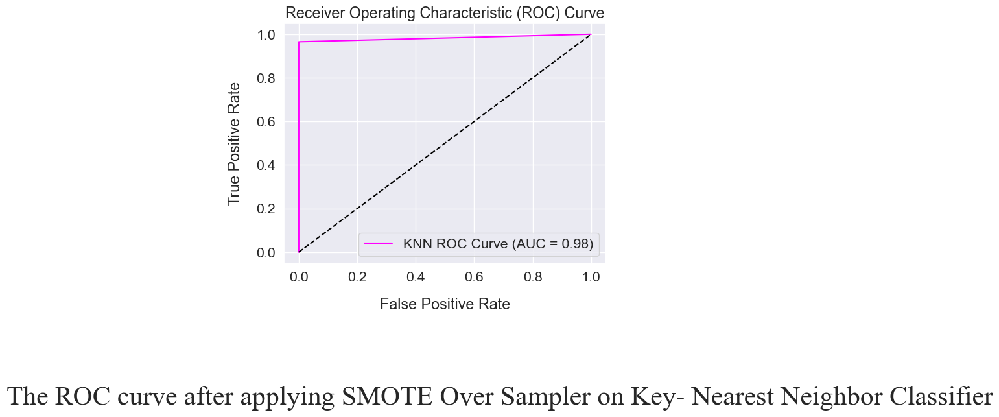

In [ ]:
y_pred_prob_KNN_smt =SupremeKNN.predict_proba(X_smote_test_scaled)[:, 1]
fpr_KNN_smt, tpr_KNN_smt, thresholds_knn_smt = roc_curve(y_smote_test, y_pred_prob_KNN_smt)
roc_auc_KNN_smt = auc(fpr_KNN_smt, tpr_KNN_smt)

plt.plot(fpr_KNN_smt, tpr_KNN_smt, color='magenta', label=f'KNN ROC Curve (AUC = {roc_auc_KNN_smt:.2f})')
plt.plot([0, 1], [0, 1], color='black', linestyle='--')

plt.xlabel('False Positive Rate', labelpad=15)
plt.ylabel('True Positive Rate', labelpad=15)
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc='lower right')

plt.text(-1, -0.7, 'The ROC curve after applying SMOTE Over Sampler on Key- Nearest Neighbor Classifier', fontproperties=font_footer_roc_curve)

Text(-1, -0.7, 'Evaluating ROC Curves of Key-Nearest Neighbor Classifier for Various Scenarios')

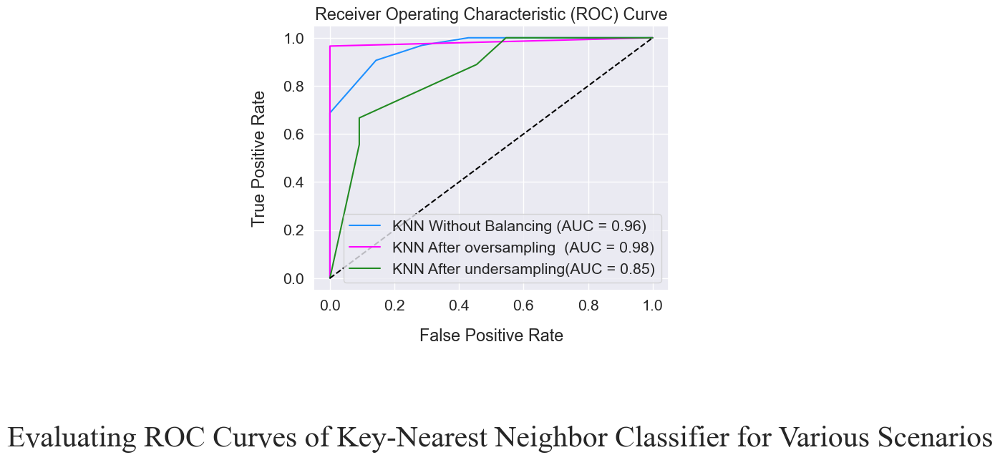

In [ ]:
y_pred_prob_KNN =KNN.predict_proba(X_test_scaled)[:, 1]
fpr_KNN, tpr_KNN, thresholds_KNN = roc_curve(y_test, y_pred_prob_KNN)
roc_auc_KNN = auc(fpr_KNN, tpr_KNN)

y_pred_prob_KNN_smt =SupremeKNN.predict_proba(X_smote_test_scaled)[:, 1]
fpr_KNN_smt, tpr_KNN_smt, thresholds_knn_smt = roc_curve(y_smote_test, y_pred_prob_KNN_smt)
roc_auc_KNN_smt = auc(fpr_KNN_smt, tpr_KNN_smt)

y_pred_prob_KNN_und =KNN.predict_proba(X_under_test_scaled)[:, 1]
fpr_KNN_und, tpr_KNN_und, thresholds_knn_und = roc_curve(y_under_test, y_pred_prob_KNN_und)
roc_auc_KNN_und = auc(fpr_KNN_und, tpr_KNN_und)

plt.plot(fpr_KNN, tpr_KNN, color='dodgerblue', label=f'KNN Without Balancing (AUC = {roc_auc_KNN:.2f})')
plt.plot(fpr_KNN_smt, tpr_KNN_smt, color='magenta', label=f'KNN After oversampling  (AUC = {roc_auc_KNN_smt:.2f})')
plt.plot(fpr_KNN_und, tpr_KNN_und, color='forestgreen', label=f'KNN After undersampling(AUC = {roc_auc_KNN_und:.2f})')
plt.plot([0, 1], [0, 1], color='black', linestyle='--')

plt.xlabel('False Positive Rate', labelpad=15)
plt.ylabel('True Positive Rate', labelpad=15)
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc='lower right')

plt.text(-1, -0.7, 'Evaluating ROC Curves of Key-Nearest Neighbor Classifier for Various Scenarios', fontproperties=font_footer_roc_curve)

<hr>

Text(0.5, 1.0, 'Impact of Dataset Balancing Techniques on KNN Model Accuracy')

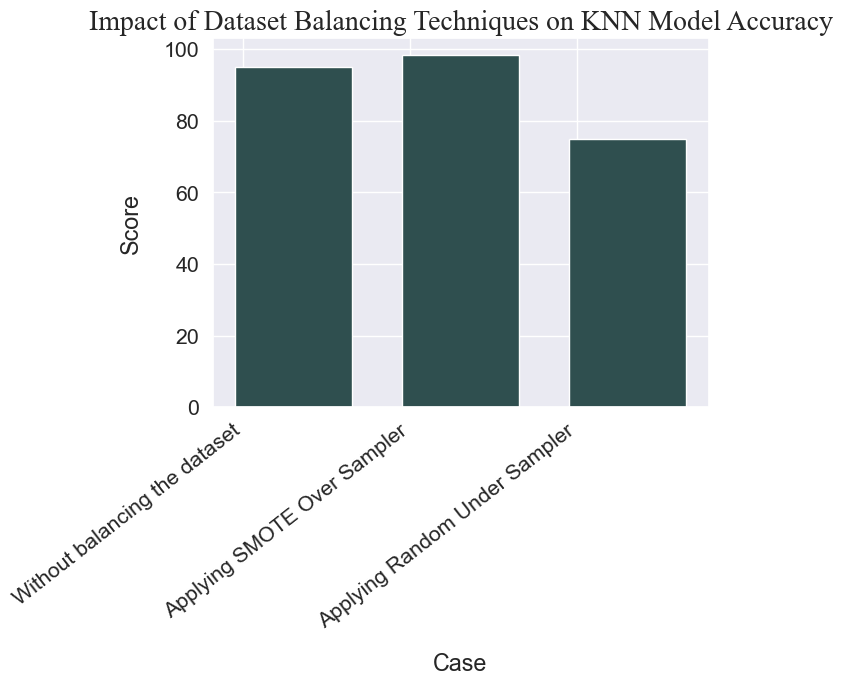

In [ ]:
Accuracy_results = {
                        'Without balancing the dataset' : [accuracy_score(y_test, y_pred_KNN)*100],

                        'Applying SMOTE Over Sampler' : [accuracy_score(y_smote_test, y_pred_SupremeKNN_smote)*100],

                        'Applying Random Under Sampler' : [accuracy_score(y_under_test, y_pred_KNN_under)*100]
}
model_names = list(Accuracy_results.keys())

x_positions = np.arange(len(model_names))
accuracy_scores = [Accuracy_results[name][0] for name in model_names]
plt.bar(x_positions + 0.2*1.5, accuracy_scores, width=0.7, label='Accuracy', color = 'darkslategray')

plt.xlabel('Case', labelpad=15)
plt.ylabel('Score', labelpad=15)
plt.xticks(x_positions, model_names, rotation=38, ha='right')
plt.title('Impact of Dataset Balancing Techniques on KNN Model Accuracy', fontproperties=font_title)

<hr>

# 6. Testing

## -- Save the model to avoid retraining in future

In [ ]:
joblib.dump(SupremeKNN,'OverPerformed_KNN_Model.pkl')

['OverPerformed_KNN_Model.pkl']

#### ----->> Test Sample

In [ ]:
pd.DataFrame(X_smote_test.reset_index(drop = True)).iloc[15]

MDVP:Fo(Hz)         202.898518
MDVP:Fhi(Hz)        211.550257
MDVP:Flo(Hz)        196.445793
MDVP:Jitter(%)        0.001786
MDVP:Jitter(Abs)      0.000009
MDVP:RAP              0.000937
MDVP:PPQ              0.001063
Jitter:DDP            0.002814
MDVP:Shimmer          0.009568
MDVP:Shimmer(dB)      0.085000
Shimmer:APQ3          0.004683
Shimmer:APQ5          0.006088
MDVP:APQ              0.007238
Shimmer:DDA           0.014042
NHR                   0.000672
HNR                  32.934113
RPDE                  0.348921
DFA                   0.741972
spread1              -7.881252
spread2               0.168190
D2                    1.461016
PPE                   0.048147
Name: 15, dtype: float64

In [ ]:
print('status : ', '\n'*2, y_smote_test.reset_index(drop = True))

status :  

 0     0
1     1
2     1
3     0
4     0
5     1
6     1
7     0
8     1
9     0
10    1
11    0
12    1
13    1
14    1
15    0
16    1
17    0
18    0
19    1
20    0
21    0
22    0
23    1
24    0
25    1
26    0
27    1
28    0
29    1
30    0
31    1
32    0
33    1
34    0
35    1
36    0
37    0
38    0
39    0
40    1
41    0
42    1
43    1
44    0
45    0
46    0
47    0
48    0
49    1
50    0
51    1
52    1
53    1
54    1
55    1
56    1
57    1
58    0
Name: status, dtype: int64


### Load the trained model

In [ ]:
KnnClassifier = joblib.load('OverPerformed_KNN_Model.pkl')

# GUI

In [ ]:
root = tk.Tk()
root.title("Parkinson Classification")

# Add labels and entry widgets for each feature
features = [ c for c in data.drop(['name', 'status'], axis = 1).columns ]

feature_entries = []
for feature in features:
    row = tk.Frame(root)
    label = tk.Label(row, width=22, text=feature+": ", anchor='w')
    entry = tk.Entry(row)
    entry.insert(0, "0.0")  # Default value
    row.pack(side=tk.TOP, fill=tk.X, padx=5, pady=5)
    label.pack(side=tk.LEFT)
    entry.pack(side=tk.RIGHT, expand=tk.YES, fill=tk.X)
    feature_entries.append(entry)

# Add a button to trigger the prediction
def predict():
    # Get the feature values from the entry widgets
    feature_values = [float(entry.get()) for entry in feature_entries]
    # Normalize the feature values using minmax
    feature_values_normalized = minmax.transform([feature_values])
    # Create a DataFrame from the normalized feature values
    input_data = pd.DataFrame(feature_values_normalized, columns=features)
    # Predict the class label using the trained model
    prediction = KnnClassifier.predict(input_data)[0]
    # Display the prediction result
    if prediction == 1:
        messagebox.showinfo("Prediction:", "Abnormal")
    else:
        messagebox.showinfo("Prediction:", "Normal")

predict_button = tk.Button(root, text="Predict", command=predict)
predict_button.pack(side=tk.BOTTOM, padx=5, pady=5)

# Start the GUI main loop
root.mainloop()